# Topic Modeling


Team: Mukta Parab (mparab1@binghamton.edu)
Ami Chauhan(achauha4@binghamton.edu),
Jacob Ditkoff(jditkof1@binghamton.edu),
Meghana Harisha (mharish1@binghamton.edu),
Prarthna Mohanraj (pmohanr1@binghamton.edu),

**1. What is the problem the three papers aim to solve, and why is this problem important or interesting?**

Accurately modeling collections of discrete data through topics, while 
maintaining relationships between data so tasks like classification, novelty detection and summarization can be done on the data. 

Probabilistic topic models are important because they allow us to organize and quantify huge sums of data at a scale that would be impossible for humans to do alone. It can also be used to identify the topics of a set of collections by detecting the patterns and recurring words.


**2. 1) Summarize the three methods, including high-level ideas as well as technical details: the relevant details that are important to focus on (e.g., if there’s a model, define it; if there is a theorem, state it and explain why it’s important, etc) 2) What are the major differences of the three methods?**

**Paper 1**


*   LDA is a three level heirarchal Bayesian model: each item of a collection is modeled as an infinite mixture over an underlying set of topics. 
*   For each document (sequence of n words) w in a corpus (collection of M documents) D LDA assumes the following generative process:
        1. Choose N ∼ Poisson(ξ).
        2. Choose θ ∼ Dir(α).
        3. For each of the N words wn:
                (a) Choose a topic zn ∼ Multinomial(θ).
                (b) Choose a word wn from p(wn |zn,β), a multinomial probability conditioned on the topic zn.
*   The topic node is repeatedly sampled within the doument.
*   Documents can be associated with multiple topics.
*   Provides well defined inference procedures for previously unseen documents.
*   Modularity and extensibiltiy of this model is an advantage.






**Paper 2**
*   Autoencoded Variational Inference (AVITM) : a black box method that is easy to apply to new models. It yields topics of equivalent quality to standard mean field inference with a decrease in training time. It matches traditional methods and accuracy with much better inference time.
*   Model: PRODLDA
*   It is a product of experts, p(wn|θ, β) ∝ k p(wn|zn = k, β) θk 
*   Defined as latent Dirichlet allocation where the word-level mixture over topics is carried out in natural parameter space. 
*   The difference between LDA and PRODLDA is that the beta is unnormalized.
*   Yields much more interpretable topics.
*   PRODLDA is an instance of the exponential-family PCA.
*   It relates to the exponential-family harmoniums but with nonGaussian priors. 














**Paper 3**

  *   top2vec leverages joint document and word semantic embedding to find the topic vectors
  *   This model automatically finds the number of topics and does not need stop-word lists or stemming and lemmatization.
  *   The main assumption for this model is that the number of prominent topics is equal to the number of dense areas.
  *   The top2vec model produces jointly embedded topics, documents, and word vectors. The distance between them represents semantic similarity.
  *   top2vec model finds topics that are significantly more informative and representative of the corpus trained on compared to the 
probabilistic generative models. 






**3. Implement the ProdLDA [2] topic model and test it on the 20 newsgroups text dataset (report the 20 main topics you discovered from the data and visualize their word clouds)**


In [ ]:
!pip install pyro-ppl

import os
import pyro
import pyro.distributions as dist
from pyro.infer import MCMC, NUTS
import torch

assert pyro.__version__.startswith('1.7.0')
smoke_test = 'CI' in os.environ

In [ ]:
import pandas as pd
import numpy as np
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
news = fetch_20newsgroups(subset='all')
vectorizer = CountVectorizer(max_df=0.5, min_df=20, stop_words='english')
docs = torch.from_numpy(vectorizer.fit_transform(news['data']).toarray())

vocab = pd.DataFrame(columns=['word', 'index'])
vocab['word'] = vectorizer.get_feature_names()
vocab['index'] = vocab.index



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
import math
import torch.nn as nn
import torch.nn.functional as F
from pyro.infer import SVI, TraceMeanField_ELBO
from tqdm import trange

In [ ]:
class Encoder(nn.Module):
    def __init__(self, vocab_size, num_topics, hidden, dropout):
        super().__init__()
        self.drop = nn.Dropout(dropout)  
        self.fc1 = nn.Linear(vocab_size, hidden)
        self.fc2 = nn.Linear(hidden, hidden)
        self.fcmu = nn.Linear(hidden, num_topics)
        self.fclv = nn.Linear(hidden, num_topics)
        self.bnmu = nn.BatchNorm1d(num_topics, affine=False)  
        self.bnlv = nn.BatchNorm1d(num_topics, affine=False)  

    def forward(self, inputs):
        h = F.softplus(self.fc1(inputs))
        h = F.softplus(self.fc2(h))
        h = self.drop(h)

        logtheta_loc = self.bnmu(self.fcmu(h))
        logtheta_logvar = self.bnlv(self.fclv(h))
        logtheta_scale = (0.5 * logtheta_logvar).exp()  
        return logtheta_loc, logtheta_scale


class Decoder(nn.Module):
    def __init__(self, vocab_size, num_topics, dropout):
        super().__init__()
        self.beta = nn.Linear(num_topics, vocab_size, bias=False)
        self.bn = nn.BatchNorm1d(vocab_size, affine=False)
        self.drop = nn.Dropout(dropout)

    def forward(self, inputs):
        inputs = self.drop(inputs)
        return F.softmax(self.bn(self.beta(inputs)), dim=1)


class ProdLDA(nn.Module):
    def __init__(self, vocab_size, num_topics, hidden, dropout):
        super().__init__()
        self.vocab_size = vocab_size
        self.num_topics = num_topics
        self.encoder = Encoder(vocab_size, num_topics, hidden, dropout)
        self.decoder = Decoder(vocab_size, num_topics, dropout)

    def model(self, docs):
        pyro.module("decoder", self.decoder)
        with pyro.plate("documents", docs.shape[0]):
            logtheta_loc = docs.new_zeros((docs.shape[0], self.num_topics))
            logtheta_scale = docs.new_ones((docs.shape[0], self.num_topics))
            logtheta = pyro.sample(
                "logtheta", dist.Normal(logtheta_loc, logtheta_scale).to_event(1))
            theta = F.softmax(logtheta, -1)


            count_param = self.decoder(theta)
            total_count = int(docs.sum(-1).max())
            pyro.sample(
                'obs',
                dist.Multinomial(total_count, count_param),
                obs=docs
            )

    def guide(self, docs):
        pyro.module("encoder", self.encoder)
        with pyro.plate("documents", docs.shape[0]):
            logtheta_loc, logtheta_scale = self.encoder(docs)
            logtheta = pyro.sample(
                "logtheta", dist.Normal(logtheta_loc, logtheta_scale).to_event(1))

    def beta(self):
        return self.decoder.beta.weight.cpu().detach().T

In [ ]:
# setting global variables
seed = 0
torch.manual_seed(seed)
pyro.set_rng_seed(seed)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

num_topics = 20 if not smoke_test else 3
docs = docs.float().to(device)
batch_size = 32
learning_rate = 1e-3
num_epochs = 50 if not smoke_test else 1

In [ ]:
# training
pyro.clear_param_store()

prodLDA = ProdLDA(
    vocab_size=docs.shape[1],
    num_topics=num_topics,
    hidden=100 if not smoke_test else 10,
    dropout=0.2
)
prodLDA.to(device)

optimizer = pyro.optim.Adam({"lr": learning_rate})
svi = SVI(prodLDA.model, prodLDA.guide, optimizer, loss=TraceMeanField_ELBO())
num_batches = int(math.ceil(docs.shape[0] / batch_size)) if not smoke_test else 1

bar = trange(num_epochs)
for epoch in bar:
    running_loss = 0.0
    for i in range(num_batches):
        batch_docs = docs[i * batch_size:(i + 1) * batch_size, :]
        loss = svi.step(batch_docs)
        running_loss += loss / batch_docs.size(0)

    bar.set_postfix(epoch_loss='{:.2e}'.format(running_loss))

100%|██████████| 50/50 [26:48<00:00, 32.18s/it, epoch_loss=3.72e+05]


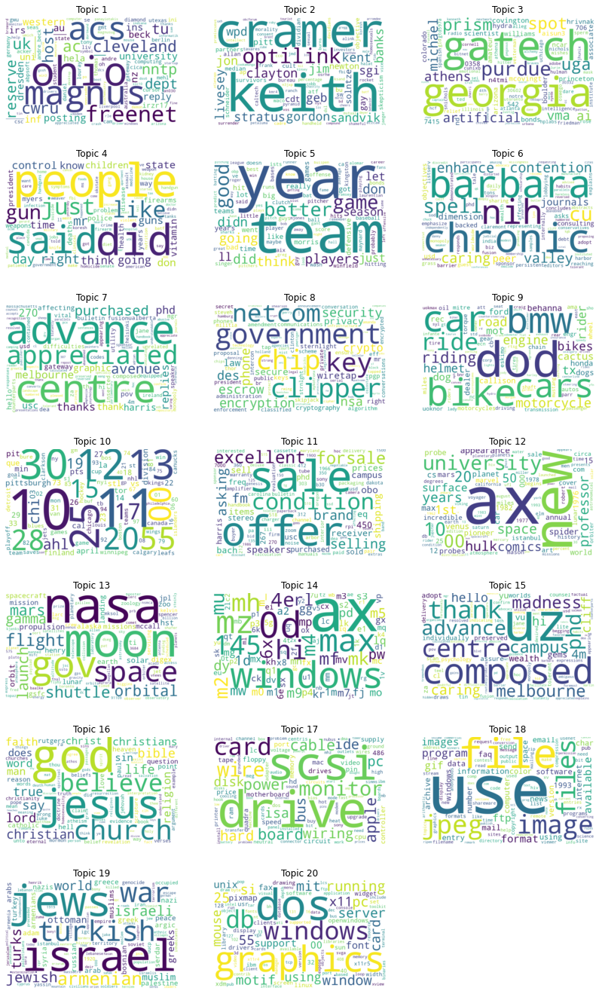

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
def plot_word_cloud(b, ax, v, n):
    sorted_, indices = torch.sort(b, descending=True)
    df = pd.DataFrame(indices[:100].numpy(), columns=['index'])
    words = pd.merge(df, vocab[['index', 'word']],
                     how='left', on='index')['word'].values.tolist()
    sizes = (sorted_[:100] * 1000).float().numpy().tolist()
    freqs = {words[i]: sizes[i] for i in range(len(words))}
    wc = WordCloud(background_color="white", width=800, height=500)
    wc = wc.generate_from_frequencies(freqs)
    ax.set_title('Topic %d' % (n + 1))
    ax.imshow(wc, interpolation='bilinear')
    ax.axis("off")

if not smoke_test:
    
    beta = prodLDA.beta()
    fig, axs = plt.subplots(7, 3, figsize=(14, 24))
    for n in range(beta.shape[0]):
        i, j = divmod(n, 3)
        plot_word_cloud(beta[n], axs[i, j], vocab, n)
    axs[-1, -1].axis('off');

    plt.show()

**4. Implement Latent Dirichlet Allocation (LDA) [1] and test it on the 20 newsgroups text dataset (report the 20 main topics you discovered from the data and visualize their word clouds)**

In [ ]:
#Imports and getting the data

!pip install gensim
!pip install nltk

import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
import nltk
import nltk.stem as stemmer
from nltk.stem import *
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.stem.porter import *
nltk.download('wordnet')
import numpy as np
import matplotlib.pyplot as plt
np.random.seed(400)
import pandas as pd 
from wordcloud import WordCloud
from sklearn.datasets import fetch_20newsgroups
newsgroups_train = fetch_20newsgroups(subset='train', shuffle = True)
newsgroups_test = fetch_20newsgroups(subset='test', shuffle = True)

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
#Preprocessing the data by tokenizing and lemmatizing it

def lemmatize_stemming(text):
    stemmer = PorterStemmer()
    return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v'))
# Tokenize and lemmatize
def preprocess(text):
    result=[]
    for token in gensim.utils.simple_preprocess(text) :
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(lemmatize_stemming(token))
            
    return result

In [ ]:
#Putting data into 'bag of words'

processed_docs = []

for doc in newsgroups_train.data:
    processed_docs.append(preprocess(doc))

dictionary = gensim.corpora.Dictionary(processed_docs)
bow_corpus = [dictionary.doc2bow(doc) for doc in processed_docs]

In [ ]:
#Running the model

lda_model =  gensim.models.LdaMulticore(bow_corpus, num_topics = 20, id2word = dictionary, passes = 10, workers = 2)

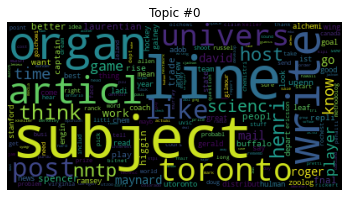

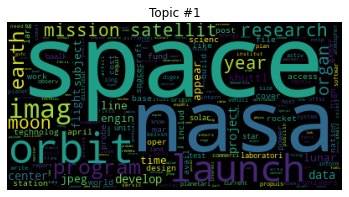

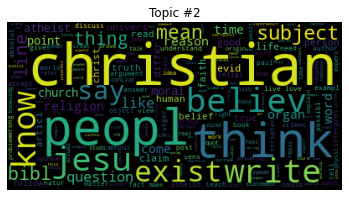

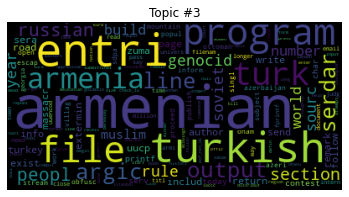

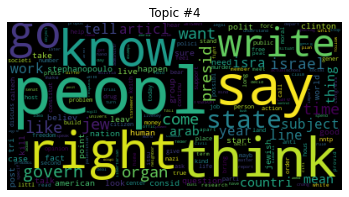

...

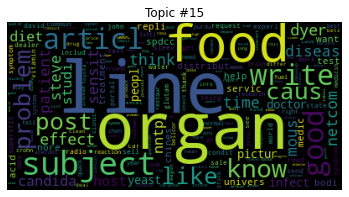

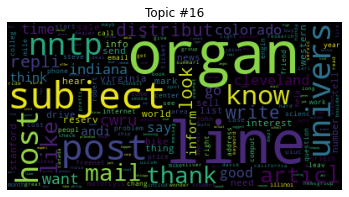

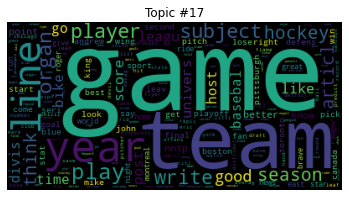

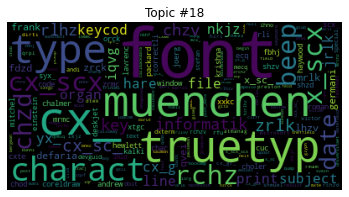

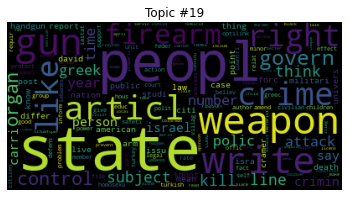

In [ ]:
#Generating the wordcloud

for topic in range(lda_model.num_topics):
    #print(lda_model.num_topics)
    plt.figure()
    plt.imshow(WordCloud().fit_words(dict(lda_model.show_topic(topic, 200))))
    plt.axis("off")
    plt.title("Topic #" + str(topic))
    plt.show()

**5. Implement TOP2VEC [3] and test it on the 20 newsgroups text dataset (report the 20 main topics you discovered from the data and visualize their word clouds)**


In [ ]:
!pip install top2vec

In [ ]:
from top2vec import Top2Vec
from sklearn.datasets import fetch_20newsgroups

newsgroups = fetch_20newsgroups(subset='all', remove=('headers', 'footers', 'quotes'))
model = Top2Vec(documents=newsgroups.data, speed="learn", workers=8)


2021-12-11 00:46:53,400 - top2vec - INFO - Pre-processing documents for training
2021-12-11 00:47:03,798 - top2vec - INFO - Creating joint document/word embedding
2021-12-11 00:58:49,839 - top2vec - INFO - Creating lower dimension embedding of documents
/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)
2021-12-11 00:59:28,902 - top2vec - INFO - Finding dense areas of documents
2021-12-11 00:59:32,476 - top2vec - INFO - Finding topics


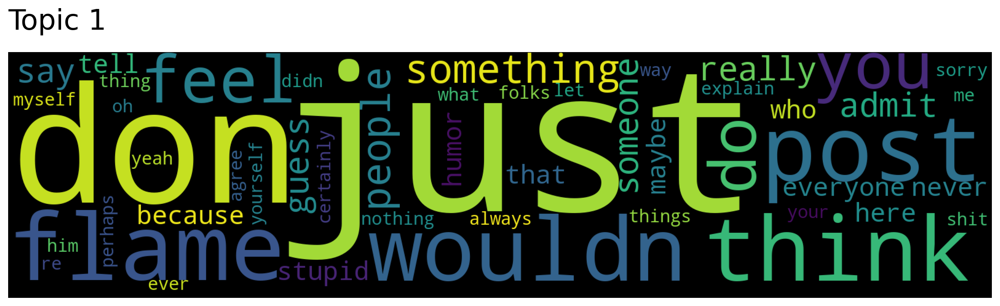

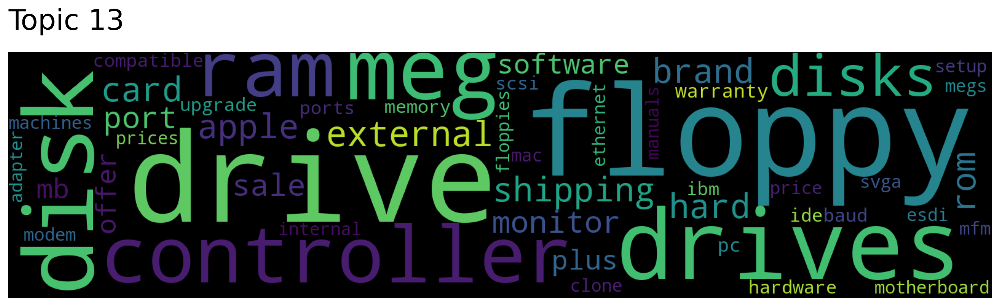

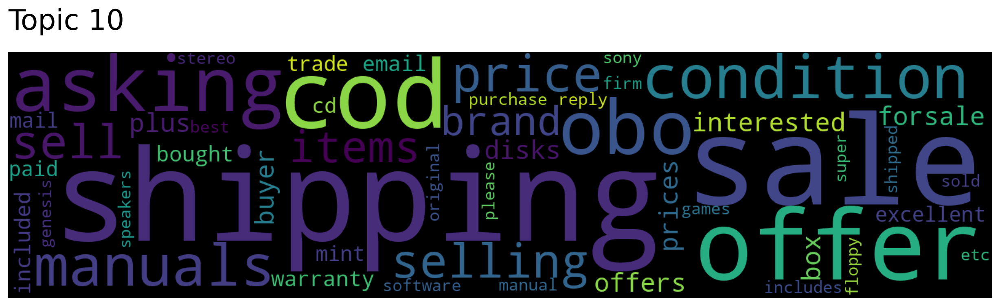

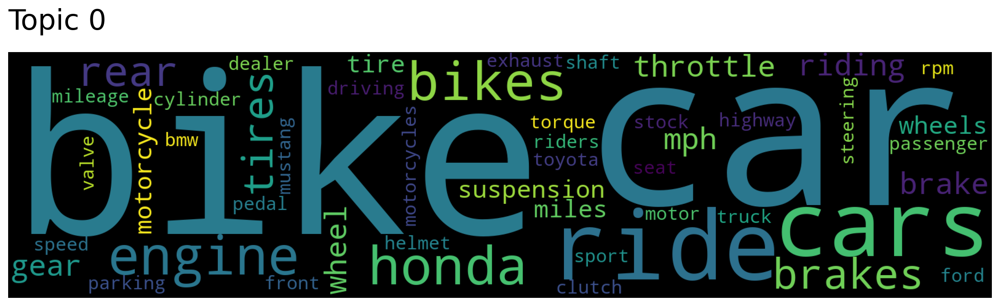

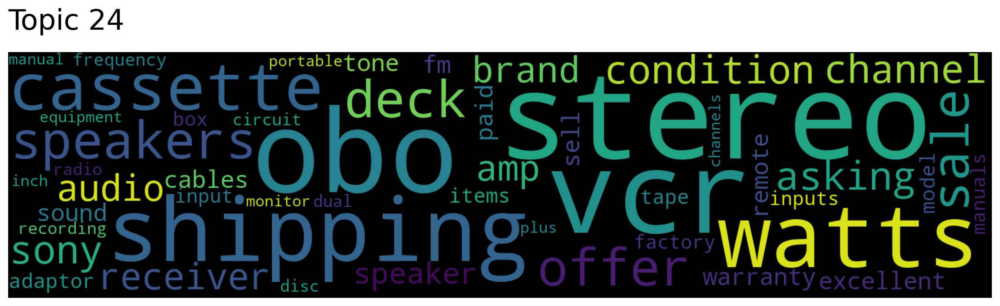

...

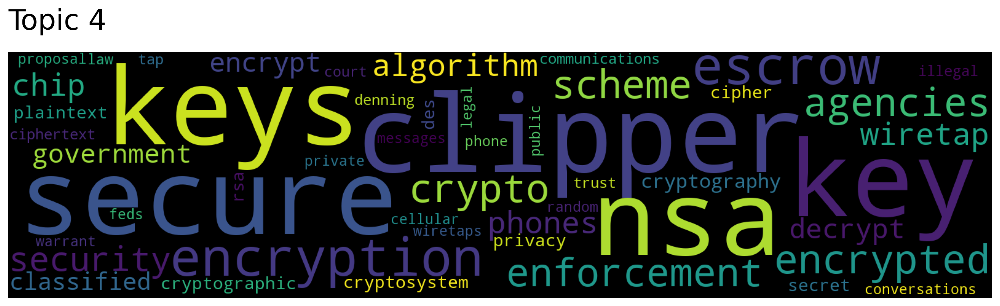

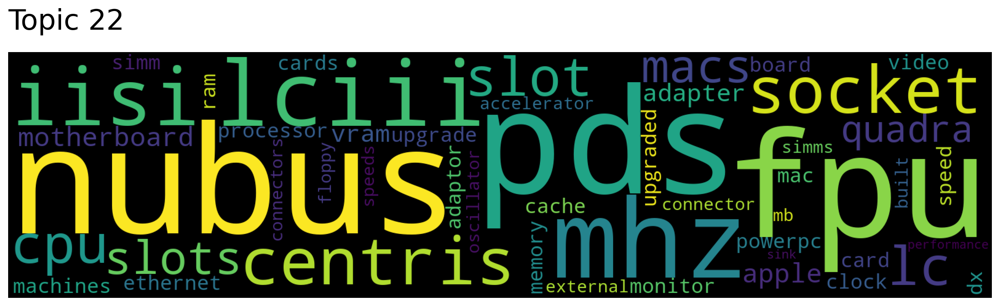

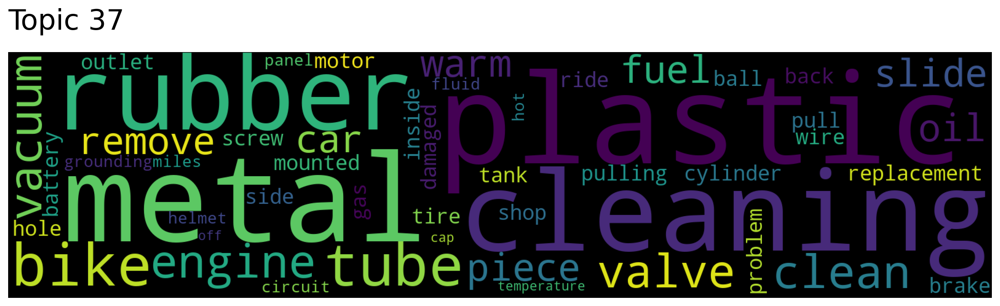

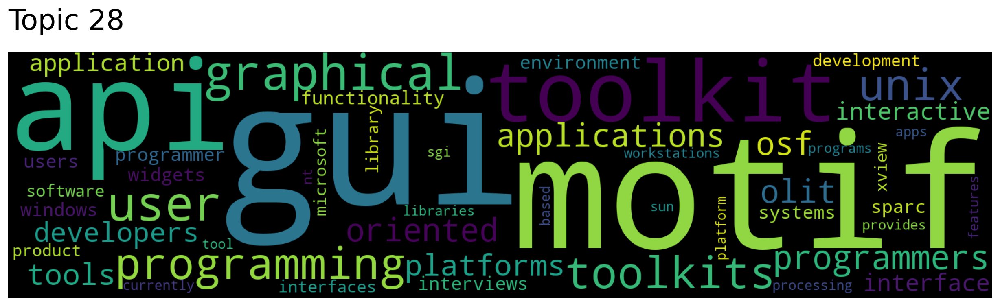

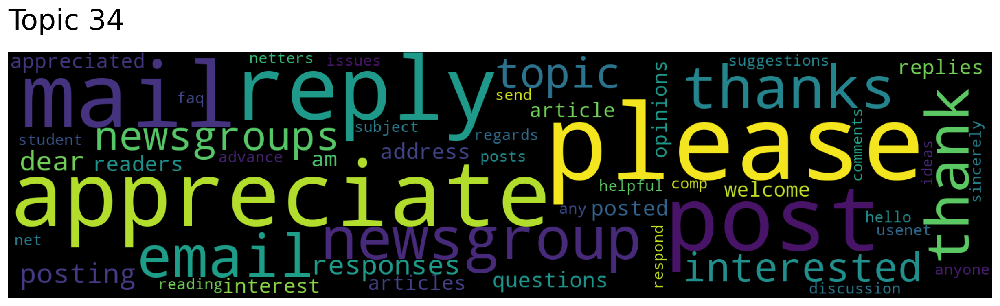

In [ ]:
topic_words, word_scores, topic_scores = model.get_topics()
topic_list = []
for doc in topic_words:
  for topic in doc:
    topic_list.append(topic)

topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=topic_list, num_topics=20)
for topic in topic_nums:
  model.generate_topic_wordcloud(topic)

**6. Compare the experimental results of the three methods with the ground truth topics of the 20 newsgroups. Which method do you think is better? Explain why.**

- All three models produced different results when visualized through wordclouds.
- ProdLDA took the longest to train using the 20newsgroups dataset.
- Top2Vec was the quickest to train with 20newsgroups.
- Top2Vec seemed to produce topics that were more representative of the data it was trained on compared to LDA and ProdLDA. 



**7. Fetch real-time tweets and discover real-time topics on them with the three methods, respectively. You need to report the top 5 topics for the last 5 seconds in real-time and the top 5 topics for each hour in the most recent 24 hours.**

In [ ]:
#Printing twitter topics for the last 5 seconds

!pip install torch
!pip install requests
!pip install pytz
!pip install top2vec
!pip install gensim
!pip install nltk
!pip install top2vec

from wordcloud import WordCloud
import nltk
import nltk.stem as stemmer
from nltk.stem import *
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.stem.porter import *
nltk.download('wordnet')
import pandas as pd
import numpy as np
import torch
from sklearn.feature_extraction.text import CountVectorizer
import requests
import os
import json
from pytz import timezone
from top2vec import Top2Vec
import gensim
from datetime import datetime, timedelta



# These two functions are for LDA
def lemmatize_stemming(text):
    stemmer = PorterStemmer()
    return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v'))
# Tokenize and lemmatize
def preprocess(text):
    result=[]
    for token in gensim.utils.simple_preprocess(text) :
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(lemmatize_stemming(token))
            
    return result
# End of LDA functions



# This is a throwaway token for a twitter dev account we made. Best practice is to export this token to an OS environment variable and use that instead so no tokens are outward facing
bearer_token = "AAAAAAAAAAAAAAAAAAAAANpDWgEAAAAAXP3yKjur0GnXLyAyICG%2BdRmo03w%3D271I8otWNMlgqYMsm3vXHHOUX1TovJgE53IiAqqZqC7iMPe0CA"

#Creating headers and formatting our request to Twitter API endpoint
headers = {"Authorization": "Bearer {}".format(bearer_token)}
search_url = "https://api.twitter.com/2/tweets/search/recent"
eastern = timezone('US/Eastern')
current_time = datetime.now(eastern)
start_time = current_time - timedelta(0,5)
start_time = start_time.isoformat()[:-8] + "Z"
end_time = current_time.isoformat()[:-8] + "Z"

query_params = {'query': "all lang:en",
                    'start_time': start_time,
                    'end_time': end_time,
                    'max_results': 100,
                    'tweet.fields': 'id,text'
                }

response = requests.request("GET", search_url, headers = headers, params = query_params)
if response.status_code != 200:
  raise Exception(response.status_code, response.text)
twitter_response = response.json()
data = twitter_response['data']

#Once we have our data, we extract the tweets from it so we can run the models
tweets = []
for item in data:
  tweets.append(item['text'])


print(
    '''
    ------------------------------------------------
     Printing Twitter topics for the past 5 seconds
    ------------------------------------------------
    '''

)

#LDA CODE

print(
'''
------------------------------------------------------------------------------------
------------------------------------------------------------------------------------
------------------------------------------------------------------------------------
------------------------------------------------------------------------------------
------------------------------------------------------------------------------------
------------------------------------------------------------------------------------
                                    LDA Model

'''
)

processed_docs = []

for tweet in tweets:
   processed_docs.append(preprocess(tweet))

dictionary = gensim.corpora.Dictionary(processed_docs)
bow_corpus = [dictionary.doc2bow(doc) for doc in processed_docs]

lda_model =  gensim.models.LdaMulticore(bow_corpus, num_topics = 5, id2word = dictionary, passes = 10, workers = 2)
for topic in range(lda_model.num_topics):
    print("Topic:")
    print(lda_model.show_topic(topic, 5))

# END OF LDA CODE


# ------------------------------------------------------------------------------------ #


#TOP2VEC CODE

proc_docs = []

for tweet in tweets:
   proc_docs.append(preprocess(tweet))

flatList = [item for elem in proc_docs for item in elem]
print(
 '''
 ------------------------------------------------------------------------------------
 ------------------------------------------------------------------------------------
 ------------------------------------------------------------------------------------
 ------------------------------------------------------------------------------------
 ------------------------------------------------------------------------------------
 ------------------------------------------------------------------------------------
                                     Top2Vec Model

 '''
 )

top2vec_model = Top2Vec(documents=flatList, speed="learn", workers=10,min_count=1)
print("Topics Found:")
print(top2vec_model.get_num_topics())
print("Topics:")
print(top2vec_model.topic_words)


#END TOP2VEC CODE

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!

    ------------------------------------------------
     Printing Twitter topics for the past 5 seconds
    ------------------------------------------------
    

------------------------------------------------------------------------------------
------------------------------------------------------------------------------------
------------------------------------------------------------------------------------
------------------------------------------------------------------------------------
------------------------------------------------------------------------------------
------------------------------------------------------------------------------------
                                    LDA Model




2021-12-11 01:00:38,417 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:00:38,428 - top2vec - INFO - Creating joint document/word embedding


Topic:
[('http', 0.032474775), ('like', 0.009280411), ('covid', 0.0063991975), ('state', 0.006370762), ('alpha', 0.006365164)]
Topic:
[('http', 0.018164873), ('candl', 0.012299275), ('black', 0.012299273), ('love', 0.009389104), ('think', 0.009373236)]
Topic:
[('night', 0.012307695), ('http', 0.012293555), ('peopl', 0.009947728), ('thank', 0.009934678), ('life', 0.007586161)]
Topic:
[('http', 0.013873819), ('work', 0.011220387), ('polic', 0.008546345), ('nation', 0.008535839), ('huge', 0.008535115)]
Topic:
[('http', 0.02552838), ('phone', 0.009583306), ('today', 0.007303335), ('target', 0.0072987783), ('state', 0.005023813)]

 ------------------------------------------------------------------------------------
 ------------------------------------------------------------------------------------
 ------------------------------------------------------------------------------------
 ------------------------------------------------------------------------------------
 ---------------------

2021-12-11 01:00:40,411 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:00:52,600 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:00:52,647 - top2vec - INFO - Finding topics


Topics Found:
3
Topics:
[['campaign' 'oeyh' 'instagram' 'wjzlo' 'help' 'lemon' 'note' 'night'
  'tech' 'cherri' 'treatment' 'agshhd' 'lefter' 'harri' 'wake' 'beat'
  'vicderbyshir' 'import' 'rachel' 'mail' 'francispavia' 'kiddykongfact'
  'extra' 'shop' 'susiebdd' 'bitcoin' 'away' 'spend' 'reece_youngk'
  'format' 'pretti' 'deserv' 'festiv' 'disast' 'zhzjcp' 'wednesday'
  'attempt' 'ignor' 'media' 'right' 'blame' 'light' 'catch' 'miss'
  'nurseri' 'squad' 'tina' 'gonna' 'dupagechildren' 'breakfast']
 ['lose' 'mayuri_saxena' 'combust' 'binnacl' 'cocki' 'itstexast'
  'maskoffmo' 'blow' 'humanright' 'father' 'lmfaoo' 'ethiopia' 'histori'
  'version' 'simpli' 'childrensbook' 'mail' 'hadeejasouffl' 'forward'
  'democraci' 'aggress' 'hope' 'bore' 'refresh' 'employe' 'larg' 'cri'
  'old' 'narrow' 'happiest' 'premier' 'control' 'time' 'school'
  'adam_pen' 'court' 'billeneseyoum' 'opportun' 'dprint' 'cybersecur'
  'challeng' 'arent' 'care' 'pcgamer' 'ehrz' 'master' 'clearli' 'festiv'
  'instit

In [ ]:
!pip install pyro-ppl

import gensim
from datetime import datetime, timedelta
import pyro
import pyro.distributions as dist
from pyro.infer import MCMC, NUTS
import torch

import math
import torch.nn as nn
import torch.nn.functional as F
from pyro.infer import SVI, TraceMeanField_ELBO
from tqdm import trange

assert pyro.__version__.startswith('1.7.0')
#Enable smoke test - run the notebook cells on CI.
smoke_test = 'CI' in os.environ

import pandas as pd
import numpy as np
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import CountVectorizer

print(
 '''
 ------------------------------------------------------------------------------------
 ------------------------------------------------------------------------------------
 ------------------------------------------------------------------------------------
 ------------------------------------------------------------------------------------
 ------------------------------------------------------------------------------------
 ------------------------------------------------------------------------------------
                                     ProdLDA Model

 '''
 )
class Encoder(nn.Module):
    # Base class for the encoder net, used in the guide
    def __init__(self, vocab_size, num_topics, hidden, dropout):
        super().__init__()
        self.drop = nn.Dropout(dropout)  # to avoid component collapse
        self.fc1 = nn.Linear(vocab_size, hidden)
        self.fc2 = nn.Linear(hidden, hidden)
        self.fcmu = nn.Linear(hidden, num_topics)
        self.fclv = nn.Linear(hidden, num_topics)
        # NB: here we set `affine=False` to reduce the number of learning parameters
        # See https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html
        # for the effect of this flag in BatchNorm1d
        self.bnmu = nn.BatchNorm1d(num_topics, affine=False)  # to avoid component collapse
        self.bnlv = nn.BatchNorm1d(num_topics, affine=False)  # to avoid component collapse

    def forward(self, inputs):
        h = F.softplus(self.fc1(inputs))
        h = F.softplus(self.fc2(h))
        h = self.drop(h)
        # μ and Σ are the outputs
        logtheta_loc = self.bnmu(self.fcmu(h))
        logtheta_logvar = self.bnlv(self.fclv(h))
        logtheta_scale = (0.5 * logtheta_logvar).exp()  # Enforces positivity
        return logtheta_loc, logtheta_scale


class Decoder(nn.Module):
    # Base class for the decoder net, used in the model
    def __init__(self, vocab_size, num_topics, dropout):
        super().__init__()
        self.beta = nn.Linear(num_topics, vocab_size, bias=False)
        self.bn = nn.BatchNorm1d(vocab_size, affine=False)
        self.drop = nn.Dropout(dropout)

    def forward(self, inputs):
        inputs = self.drop(inputs)
        # the output is σ(βθ)
        return F.softmax(self.bn(self.beta(inputs)), dim=1)


class ProdLDA(nn.Module):
    def __init__(self, vocab_size, num_topics, hidden, dropout):
        super().__init__()
        self.vocab_size = vocab_size
        self.num_topics = num_topics
        self.encoder = Encoder(vocab_size, num_topics, hidden, dropout)
        self.decoder = Decoder(vocab_size, num_topics, dropout)

    def model(self, docs):
        pyro.module("decoder", self.decoder)
        with pyro.plate("documents", docs.shape[0]):
            # Dirichlet prior 𝑝(𝜃|𝛼) is replaced by a logistic-normal distribution
            logtheta_loc = docs.new_zeros((docs.shape[0], self.num_topics))
            logtheta_scale = docs.new_ones((docs.shape[0], self.num_topics))
            logtheta = pyro.sample(
                "logtheta", dist.Normal(logtheta_loc, logtheta_scale).to_event(1))
            theta = F.softmax(logtheta, -1)

            # conditional distribution of 𝑤𝑛 is defined as
            # 𝑤𝑛|𝛽,𝜃 ~ Categorical(𝜎(𝛽𝜃))
            count_param = self.decoder(theta)
            # Currently, PyTorch Multinomial requires `total_count` to be homogeneous.
            # Because the numbers of words across documents can vary,
            # we will use the maximum count accross documents here.
            # This does not affect the result because Multinomial.log_prob does
            # not require `total_count` to evaluate the log probability.
            total_count = int(docs.sum(-1).max())
            pyro.sample(
                'obs',
                dist.Multinomial(total_count, count_param),
                obs=docs
            )

    def guide(self, docs):
        pyro.module("encoder", self.encoder)
        with pyro.plate("documents", docs.shape[0]):
            # Dirichlet prior 𝑝(𝜃|𝛼) is replaced by a logistic-normal distribution,
            # where μ and Σ are the encoder network outputs
            logtheta_loc, logtheta_scale = self.encoder(docs)
            logtheta = pyro.sample(
                "logtheta", dist.Normal(logtheta_loc, logtheta_scale).to_event(1))

    def beta(self):
        # beta matrix elements are the weights of the FC layer on the decoder
        return self.decoder.beta.weight.cpu().detach().T


# setting global variables

# This is a throwaway token for a twitter dev account we made. Best practice is to export this token to an OS environment variable and use that instead so no tokens are outward facing
bearer_token = "AAAAAAAAAAAAAAAAAAAAANpDWgEAAAAAXP3yKjur0GnXLyAyICG%2BdRmo03w%3D271I8otWNMlgqYMsm3vXHHOUX1TovJgE53IiAqqZqC7iMPe0CA"

#Creating headers and formatting our request to Twitter API endpoint
headers = {"Authorization": "Bearer {}".format(bearer_token)}
search_url = "https://api.twitter.com/2/tweets/search/recent"
eastern = timezone('US/Eastern')
current_time = datetime.now(eastern)
start_time = current_time - timedelta(0,5)
start_time = start_time.isoformat()[:-8] + "Z"
end_time = current_time.isoformat()[:-8] + "Z"

query_params = {'query': "all lang:en",
                        'start_time': start_time,
                        'end_time': end_time,
                        'max_results': 100,
                        'tweet.fields': 'id,text'
                }

response = requests.request("GET", search_url, headers = headers, params = query_params)
if response.status_code != 200:
  raise Exception(response.status_code, response.text)
twitter_response = response.json()
data = twitter_response['data']

#Once we have our data, we extract the tweets from it so we can run the models
tweets = []
for item in data:
  tweets.append(item['text'])

          # END OF GRABBING TWEETS #

vectorizer = CountVectorizer(ngram_range=(1,1), min_df = 0.5)
docs = torch.from_numpy(vectorizer.fit_transform(tweets).toarray())

vocab = pd.DataFrame(columns=['word', 'index'])
vocab['word'] = vectorizer.get_feature_names()
vocab['index'] = vocab.index
        
seed = 0
torch.manual_seed(seed)
pyro.set_rng_seed(seed)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

num_topics = 5 if not smoke_test else 3
docs = docs.float().to(device)
batch_size = 32
learning_rate = 1e-3
num_epochs = 50 if not smoke_test else 1

        # training

pyro.clear_param_store()

prodLDA = ProdLDA(
        vocab_size=docs.shape[1],
        num_topics=num_topics,
        hidden=1 if not smoke_test else 10,
        dropout=0.2
    )
prodLDA.to(device)

optimizer = pyro.optim.Adam({"lr": learning_rate})
svi = SVI(prodLDA.model, prodLDA.guide, optimizer, loss=TraceMeanField_ELBO())
num_batches = int(math.ceil(docs.shape[0] / batch_size)) if not smoke_test else 1

bar = trange(num_epochs)
for epoch in bar:
    running_loss = 0.0
    for i in range(num_batches):
        batch_docs = docs[i * batch_size:(i + 1) * batch_size, :]
        loss = svi.step(batch_docs)
        running_loss += loss / batch_docs.size(0)

    bar.set_postfix(epoch_loss='{:.2e}'.format(running_loss))

print("ProdLDA Topics for the last 5 seconds: ")
print(vocab['word'])




 ------------------------------------------------------------------------------------
 ------------------------------------------------------------------------------------
 ------------------------------------------------------------------------------------
 ------------------------------------------------------------------------------------
 ------------------------------------------------------------------------------------
 ------------------------------------------------------------------------------------
                                     ProdLDA Model

 


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 27.20it/s, epoch_loss=2.11e+01]

ProdLDA Topics for the last 5 seconds: 
0    all
1     rt
2    the
Name: word, dtype: object


In [ ]:
#Printing top Twitter Topics of every hour for the past 24 hours
def LDA(x):

        #Creating headers and formatting our request to Twitter API endpoint
        headers = {"Authorization": "Bearer {}".format(bearer_token)}
        search_url = "https://api.twitter.com/2/tweets/search/recent"
        eastern = timezone('US/Eastern')
        current_time = datetime.now(eastern)
        start_time = current_time - timedelta(0,x)
        start_time = start_time.isoformat()[:-8] + "Z"
        end_time = current_time.isoformat()[:-8] + "Z"

        query_params = {'query': "all lang:en",
                            'start_time': start_time,
                            'end_time': end_time,
                            'max_results': 100,
                            'tweet.fields': 'id,text'
                        }

        response = requests.request("GET", search_url, headers = headers, params = query_params)
        if response.status_code != 200:
          raise Exception(response.status_code, response.text)
        twitter_response = response.json()
        data = twitter_response['data']

        #Once we have our data, we extract the tweets from it so we can run the models
        tweets = []
        for item in data:
          tweets.append(item['text'])


        print(
            '''
            -----------------------------------------------------------------
                                Printing Twitter topics
            -----------------------------------------------------------------
            '''

        )

      #LDA CODE

        print(
            '''
            ------------------------------------------------------------------------------------
                                                LDA Model
            ------------------------------------------------------------------------------------
            '''
            )


        processed_docs = []
        for tweet in tweets:
           processed_docs.append(preprocess(tweet))
        dictionary = gensim.corpora.Dictionary(processed_docs)
        bow_corpus = [dictionary.doc2bow(doc) for doc in processed_docs]

        lda_model =  gensim.models.LdaMulticore(bow_corpus, num_topics = 5, id2word = dictionary, passes = 10, workers = 2)
        for topic in range(lda_model.num_topics):
            print("Topic:")
            print(lda_model.show_topic(topic, 5))

        # END OF LDA CODE
        # ------------------------------------------------------------------------------------ #

In [ ]:
def hourly_LDA():
  x=3600;
  while (x <= 86400):
      LDA(x)
      x= x+3600

hourly_LDA()


            -----------------------------------------------------------------
                                Printing Twitter topics
            -----------------------------------------------------------------
            

            ------------------------------------------------------------------------------------
                                                LDA Model
            ------------------------------------------------------------------------------------
            
Topic:
[('http', 0.015077323), ('thank', 0.012189597), ('work', 0.012185797), ('time', 0.009291291), ('want', 0.009285425)]
Topic:
[('http', 0.02523959), ('report', 0.022943899), ('christma', 0.013952063), ('think', 0.0117204245), ('staff', 0.011701405)]
Topic:
[('http', 0.013649097), ('love', 0.009423182), ('want', 0.009418932), ('rule', 0.00941557), ('version', 0.009409764)]
Topic:
[('thank', 0.016887924), ('http', 0.015828826), ('prayer', 0.012086233), ('support', 0.010625456), ('love', 0.008319331)]

In [ ]:
def TOP(x):

        #Creating headers and formatting our request to Twitter API endpoint
        headers = {"Authorization": "Bearer {}".format(bearer_token)}
        search_url = "https://api.twitter.com/2/tweets/search/recent"
        eastern = timezone('US/Eastern')
        current_time = datetime.now(eastern)
        start_time = current_time - timedelta(0,x)
        start_time = start_time.isoformat()[:-8] + "Z"
        end_time = current_time.isoformat()[:-8] + "Z"

        query_params = {'query': "all lang:en",
                            'start_time': start_time,
                            'end_time': end_time,
                            'max_results': 100,
                            'tweet.fields': 'id,text'
                        }

          #TOP2VEC CODE    
        proc_docs = []

        for tweet in tweets:
              proc_docs.append(preprocess(tweet))

        flatList = [item for elem in proc_docs for item in elem]
        print(
            '''
            ------------------------------------------------------------------------------------
                                                Top2Vec Model
            ------------------------------------------------------------------------------------
            '''
            )

        top2vec_model = Top2Vec(documents=flatList, speed="learn", workers=10,min_count=1)
        print("Topics Found:")
        print(top2vec_model.get_num_topics())
        print("Topics:")
        print(top2vec_model.topic_words)


          #END TOP2VEC CODE


In [ ]:
def hourly_Top2Vec():
  x=3600;
  while (x <= 86400):
      TOP(x)
      x= x+3600

hourly_Top2Vec()

2021-12-11 01:01:31,719 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:01:31,731 - top2vec - INFO - Creating joint document/word embedding



            ------------------------------------------------------------------------------------
                                                Top2Vec Model
            ------------------------------------------------------------------------------------
            


2021-12-11 01:01:33,720 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:01:40,911 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:01:40,957 - top2vec - INFO - Finding topics
2021-12-11 01:01:41,085 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:01:41,098 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
2
Topics:
[['loan' 'pack' 'watch' 'funkiest' 'chepkemoitk' 'acc' 'martyr' 'potenti'
  'hour' 'restaur' 'rockin' 'fulli' 'littl' 'ugliest' 'jncreativ'
  'rememb' 'chloe_sanditon' 'magnific' 'kenyan' 'indi' 'competit'
  'ecd_th' 'look' 'day' 'teja' 'love' 'lidder' 'travisworlddd' 'free'
  'hungari' 'mamangilu' 'contain' 'extinct' 'bobo_deganso' 'singl'
  'cashapp' 'bracket' 'get' 'instantli' 'frankdavidpr' 'univers'
  'million' 'adityanath' 'advantag' 'rlopez' 'final' 'waits'
  'theestallion' 'courag' 'lesmissi']
 ['pikminlov' 'zlkqjwwwhu' 'understand' 'consum' 'best' 'convent' 'lgbt'
  'jacquelynehowa' 'pretrial' 'destruct' 'lebron_gain' 'interest'
  'exponenti' 'solo' 'jspujji' 'game' 'hope' 'loan' 'school'
  'tarapalmeri' 'equal' 'director' 'contest' 'honor' 'tejasswiprakash'
  'blow' 'poetri' 'call' 'aibarisu' 'grow' 'moss' 'molland' 'budget'
  'introduc' 'cours' 'stuff' 'onjizi' 'exist' 'knowledg' 'feel' 'modi'
  'hair' 'dkulgxtsvg' 'proclaim' 'tick' 'women' 'guest' 'i

2021-12-11 01:01:42,997 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:01:49,538 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:01:49,577 - top2vec - INFO - Finding topics
2021-12-11 01:01:49,689 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:01:49,712 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
4
Topics:
[['media' 'machin' 'vdfh' 'miss' 'deflationari' 'kasarani' 'bring' 'pool'
  'vote' 'link' 'world' 'pack' 'onlin' 'student' 'step' 'tent' 'metavers'
  'instantli' 'restor' 'chicagosmayor' 'price' 'instagram' 'invit'
  'internet' 'chloe_sanditon' 'crunk' 'crew' 'go' 'perfect' 'loan'
  'consid' 'funki' 'half' 'project' 'flip' 'rid' 'hell' 'lifetim'
  'zeddybar' 'mind' 'millionair' 'egyptian' 'today' 'seek' 'score'
  'esterlagraia' 'cmasio' 'queen' 'advertis' 'steami']
 ['rockin' 'week' 'ecd_th' 'night' 'case' 'hungariansim' 'drbt' 'slowli'
  'verifi' 'lvvk' 'pretrial' 'stori' 'spong' 'athl' 'tier' 'reclus'
  'announc' 'cico' 'internet' 'virgin' 'energychampion' 'waits'
  'itslanico' 'half' 'write' 'jspujji' 'yeah' 'aashna' 'jacquelynehowa'
  'hard' 'ball' 'rlopez' 'tower' 'hoggstandan' 'link' 'abort' 'account'
  'girl' 'teacher' 'hotti' 'lose' 'knewsgirl' 'extra' 'polit' 'bsbommai'
  'lifetim' 'oneluckygirl_' 'superman' 'join' 'knowledg']
 ['chicago' 'mayb' 'respon

2021-12-11 01:01:51,657 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:01:58,238 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:01:58,285 - top2vec - INFO - Finding topics
2021-12-11 01:01:58,405 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:01:58,429 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
3
Topics:
[['theestallion' 'chloe_sanditon' 'method' 'protectjimin' 'continu'
  'sound' 'vdtib' 'say' 'kasarani' 'columbu' 'ball' 'prskaward' 'design'
  'zdno' 'voxeldam' 'night' 'staff' 'abl' 'flame' 'wonder' 'glori' 'safe'
  'period' 'stjtgmwsow' 'potenti' 'spong' 'jncreativ' 'student' 'mint'
  'tent' 'buy' 'internet' 'funkiest' 'verifi' 'mannywandera' 'rwfwyy'
  'prevent' 'hate' 'gauravpandhi' 'dongsik' 'rais' 'bring' 'song'
  'eaststarradio' 'websit' 'teja' 'lgbt' 'gashawshibabaw' 'roll' 'disabl']
 ['lidder' 'tradit' 'distribut' 'valu' 'verifi' 'shit' 'http' 'ecd_th'
  'learn' 'goop' 'contain' 'tremend' 'chicago' 'crazi' 'palm' 'tower'
  'knewsgirl' 'cop' 'divers' 'see' 'hoggstandan' 'hand' 'unforgett'
  'favour' 'convert' 'urg' 'wtxdo' 'michel' 'chopper' 'bts_twt' 'bath'
  'polit' 'pari' 'dollar' 'face' 'score' 'kind' 'lawyer' 'heal'
  'exponenti' 'prosper' 'muindinduku' 'shop' 'dead' 'everlast' 'sapp'
  'period' 'price' 'pikminlov' 'cheap']
 ['normal' 'climatenexu' 

2021-12-11 01:02:00,379 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:02:06,873 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:02:06,914 - top2vec - INFO - Finding topics
2021-12-11 01:02:07,025 - top2vec - INFO - Pre-processing documents for training


Topics Found:
6
Topics:
[['piss' 'spong' 'hustl' 'right' 'hugh' 'uglysweat' 'xxyldckqq' 'mask'
  'inclus' 'greg' 'elonmansur' 'funkmasterhutch' 'jellymon' 'wear'
  'cretin' 'contain' 'join' 'directli' 'bori' 'step' 'adapt' 'detent'
  'high' 'music' 'nowplay' 'clear' 'badass' 'youth' 'everybodi' 'charg'
  'write' 'saitamaguru' 'invit' 'ffqqqet' 'crazi' 'cheap' 'lidder'
  'giant' 'know' 'dubnrg' 'http' 'report' 'rice' 'cashapp' 'debat'
  'voxelx' 'ridicul' 'gime' 'jncreativ' 'heron']
 ['crew' 'coinmarketcap' 'children' 'conserv' 'hate' 'final' 'internet'
  'cmasio' 'frankdavidpr' 'perfect' 'instagram' 'project' 'correct'
  'fulli' 'listen' 'extinct' 'lidl' 'rebecca_miano' 'instantli'
  'kasarani' 'biggboss' 'island' 'disabl' 'vdfh' 'join' 'suffer' 'help'
  'jackiekcalm' 'cure' 'yoga' 'congratul' 'stuff' 'radio' 'meet' 'case'
  'crunk' 'playin' 'messi' 'energychampion' 'interest' 'love' 'say'
  'tent' 'miss' 'plu' 'world' 'middl' 'media' 'plan' 'sweater']
 ['music' 'disgrac' 'trip' 'chloe

2021-12-11 01:02:07,560 - top2vec - INFO - Creating joint document/word embedding
2021-12-11 01:02:09,473 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:02:16,090 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:02:16,134 - top2vec - INFO - Finding topics
2021-12-11 01:02:16,245 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:02:16,268 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
4
Topics:
[['year' 'stori' 'goop' 'roll' 'period' 'snowsho' 'opportun' 'transit'
  'proclaim' 'josiedibosco' 'wanjirumugo' 'money' 'prskaward' 'dragon'
  'knowledg' 'peopl' 'line' 'cultur' 'choos' 'join' 'market' 'cico'
  'alekey_iso' 'brain' 'rid' 'suppli' 'ethiopia' 'directli' 'valu'
  'columbu' 'loan' 'dead' 'smallest' 'favour' 'suggest' 'xxyldckqq'
  'destruct' 'heal' 'teas' 'momwifeesq' 'cryptom' 'retweet' 'doubt'
  'aashna' 'chicago' 'go' 'creatorerin' 'matur' 'album' 'indi']
 ['lidder' 'answer' 'write' 'anna' 'facetim' 'commun' 'vdfh' 'bori'
  'taigxrp' 'perfect' 'project' 'sapp' 'help' 'slap' 'serv' 'group'
  'elonmansur' 'magnific' 'happi' 'citi' 'bhakt' 'christma' 'zeddybar'
  'island' 'contribut' 'gengelstein' 'drop' 'hotti' 'journey' 'hustl'
  'eat' 'pool' 'spread' 'abil' 'treasur' 'contain' 'creatorerin' 'doubt'
  'fulli' 'wsyx' 'date' 'miss' 'gain' 'm_i_balfour' 'instantli' 'cheap'
  'http' 'number' 'continu' 'empow']
 ['appreci' 'mamavot' 'bath' 'hoggstanda

2021-12-11 01:02:18,189 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:02:24,622 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:02:24,668 - top2vec - INFO - Finding topics
2021-12-11 01:02:24,786 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:02:24,802 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
3
Topics:
[['tower' 'abil' 'marvin' 'gengelstein' 'spoil' 'chicago' 'lidlgb'
  'chain' 'grow' 'projtransit' 'littl' 'moss' 'gain' 'call' 'johnson'
  'account' 'holiday' 'otariodert' 'work' 'dept' 'idillionair'
  'exponenti' 'hungari' 'content' 'half' 'directli' 'teas' 'danc' 'even'
  'order' 'real' 'area' 'enjoy' 'meet' 'blasio' 'cheap' 'buidl' 'nadin'
  'weekend' 'hoggstandan' 'block' 'better' 'min' 'rwtaylor' 'submiss'
  'rwfwyy' 'combin' 'stjtgmwsow' 'life' 'thward']
 ['previou' 'thank' 'deck' 'cloth' 'internet' 'columbu' 'abl'
  'matricalab' 'shop' 'execut' 'tell' 'honor' 'bnphb' 'drop' 'reclus'
  'work' 'flame' 'offer' 'wanjirumugo' 'pain' 'stream' 'rememb' 'insid'
  'token' 'bitcoin' 'hack' 'school' 'help' 'hate' 'rwfwyy' 'best' 'loan'
  'felt' 'half' 'propaganda' 'miss' 'budget' 'funki' 'crunk' 'interest'
  'place' 'smallest' 'mage' 'bring' 'dont' 'journey' 'alo' 'game'
  'poetri' 'onlin']
 ['eaststarradio' 'miss' 'individu' 'bath' 'neegad' 'listen' 'hour'
  'right

2021-12-11 01:02:26,757 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:02:33,310 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:02:33,352 - top2vec - INFO - Finding topics
2021-12-11 01:02:33,460 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:02:33,481 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
6
Topics:
[['neegad' 'treasur' 'pool' 'link' 'night' 'wxwsx' 'today' 'fulli'
  'chariti' 'restor' 'instantli' 'univers' 'glori' 'enforc' 'abil'
  'miracl' 'theestallion' 'tiktok' 'hungari' 'middl' 'climat' 'crunk'
  'cop' 'crew' 'happi' 'song' 'design' 'busi' 'real' 'kind' 'interest'
  'instagram' 'even' 'twittermus' 'trip' 'anna' 'method' 'high' 'dept'
  'facetim' 'muindinduku' 'sim' 'mask' 'miss' 'hoggstandan' 'cmasio'
  'thward' 'wait' 'superman' 'audienc']
 ['esterlagraia' 'treasur' 'borai' 'previou' 'flop' 'great' 'journal'
  'journey' 'slowli' 'ffqqqet' 'hungari' 'jameshurley' 'long'
  'm_i_balfour' 'protect' 'snowsho' 'tier' 'itslanico' 'pack' 'websit'
  'spoil' 'presid' 'middl' 'livi' 'heal' 'plan' 'molland' 'fight'
  'opportun' 'etern' 'onjizi' 'offer' 'design' 'kristaw' 'wtxdo'
  'vlaunchcom' 'crazi' 'guest' 'complet' 'leader' 'kenyan' 'pool' 'miss'
  'tendenc' 'turn' 'introduc' 'abort' 'submiss' 'dkulgxtsvg' 'award']
 ['play' 'convers' 'funki' 'verifi' 'felt' '

2021-12-11 01:02:35,426 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:02:42,532 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:02:42,576 - top2vec - INFO - Finding topics
2021-12-11 01:02:42,686 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:02:42,708 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
6
Topics:
[['intellig' 'elonmansur' 'children' 'flop' 'gengelstein' 'neegad'
  'suggest' 'financi' 'place' 'lidder' 'spread' 'maxwel' 'tomorrow'
  'leader' 'tweet' 'supernatur' 'debat' 'contain' 'rwtaylor' 'base'
  'glori' 'proceed' 'self' 'dead' 'enjoy' 'real' 'buidl' 'song' 'playin'
  'album' 'zdno' 'poverti' 'taigxrp' 'btsvotingorg' 'saitamaguru'
  'restaur' 'tendenc' 'bath' 'chanc' 'smallest' 'crew' 'consum'
  'twittermus' 'listen' 'cmasio' 'heron' 'michel' 'downplay' 'egyptian'
  'exemplifi']
 ['ecd_th' 'sauna' 'ball' 'break' 'univers' 'fdkkm' 'democrat' 'proud'
  'aibarisu' 'execut' 'captur' 'team' 'onlin' 'virgin' 'colombia' 'girl'
  'movi' 'funni' 'heart' 'doubt' 'rememb' 'suppli' 'gauravpandhi'
  'nowplay' 'livi' 'releas' 'restaur' 'previou' 'talk' 'sound' 'friend'
  'verifi' 'cretin' 'wvfk' 'rwfwyy' 'method' 'best' 'frankdavidpr' 'indi'
  'island' 'bath' 'stori' 'stuff' 'teacher' 'itslanico' 'home' 'cloth'
  'lifetim' 'poetri' 'suggest']
 ['wish' 'best' 'tent' '

2021-12-11 01:02:44,657 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:02:51,179 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:02:51,224 - top2vec - INFO - Finding topics
2021-12-11 01:02:51,336 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:02:51,355 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
3
Topics:
[['chariti' 'bobo_deganso' 'kristaw' 'flame' 'song' 'rwfwyy' 'favour'
  'start' 'trip' 'detaine' 'tell' 'hate' 'dsagg' 'best' 'sick' 'livi'
  'mint' 'marvin' 'see' 'clear' 'wait' 'singl' 'funni' 'internet' 'wish'
  'student' 'suggest' 'wanjirumugo' 'heron' 'home' 'lgbt' 'everybodi'
  'game' 'advantag' 'health' 'rebecca_miano' 'zlkqjwwwhu' 'long'
  'contact' 'island' 'felt' 'wash' 'bracket' 'metavers' 'pkaxvdcvwa'
  'wilson__valdez' 'badass' 'billion' 'convert' 'funki']
 ['restaur' 'spong' 'trivial' 'shop' 'build' 'serv' 'burden' 'execut'
  'moss' 'ugli' 'tower' 'excel' 'extra' 'kengenkenya' 'spend' 'suppli'
  'abil' 'pikminlov' 'let' 'wtxdo' 'lvvk' 'check' 'everlast' 'human'
  'tent' 'critic' 'tedlieu' 'noveliciouss' 'funkmasterhutch' 'pari'
  'draculafetu' 'zlkqjwwwhu' 'littl' 'jameshurley' 'elect' 'chain'
  'financi' 'get' 'perfect' 'degre' 'deflationari' 'voxelxnetwork'
  'cuddl' 'middl' 'fulli' 'member' 'combin' 'machin' 'websit' 'karma']
 ['abil' 'alekey_is

2021-12-11 01:02:53,317 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:02:59,947 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:02:59,992 - top2vec - INFO - Finding topics
2021-12-11 01:03:00,103 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:03:00,121 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
5
Topics:
[['blasio' 'mgjadepw' 'pledg' 'prosper' 'member' 'like' 'buy' 'diplomat'
  'scammer' 'http' 'marvin' 'singl' 'product' 'rememb' 'stori' 'journey'
  'verifi' 'individu' 'jspujji' 'borai' 'vdfh' 'feel' 'night' 'bnphb'
  'yoga' 'roll' 'crunk' 'beauti' 'marginalis' 'market' 'ecd_th'
  'zlkqjwwwhu' 'contest' 'fix' 'period' 'bori' 'bitcoin' 'sandibinbon'
  'throw' 'theestallion' 'drag' 'donat' 'hustl' 'present' 'mizar'
  'disgrac' 'climat' 'teacher' 'treat' 'modi']
 ['deliveri' 'buildintogam' 'life' 'zlkqjwwwhu' 'person' 'tent'
  'pikminlov' 'team' 'follow' 'case' 'playin' 'respons' 'song' 'countri'
  'enforc' 'internet' 'crew' 'msgugstar' 'bxrk' 'cmasio' 'ebooklingo'
  'avail' 'coinmarketcap' 'guest' 'contest' 'perfect' 'biggboss'
  'theestallion' 'roblox' 'singl' 'artbyjacstudio' 'intellig' 'instantli'
  'hoggstandan' 'go' 'realieshan' 'flip' 'neegad' 'instagram' 'machin'
  'kasarani' 'ball' 'qcebmi' 'happi' 'walk' 'compani' 'even' 'surgeri'
  'consum' 'detent']
 ['

2021-12-11 01:03:02,102 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:03:09,155 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:03:09,204 - top2vec - INFO - Finding topics
2021-12-11 01:03:09,312 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:03:09,332 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
3
Topics:
[['exist' 'listen' 'bring' 'modi' 'chanc' 'matricalab' 'media' 'joowon'
  'chopper' 'hungari' 'proceed' 'vdfh' 'place' 'columbu' 'kristaw'
  'directli' 'children' 'buildintogam' 'giant' 'today' 'adityanath'
  'budget' 'zdno' 'frankdavidpr' 'destruct' 'love' 'jellymon' 'long'
  'cop' 'hearti' 'team' 'excel' 'sweater' 'crew' 'draculafetu' 'step'
  'jncreativ' 'hotlinejosh' 'cheap' 'updat' 'question' 'hotel' 'best'
  'enforc' 'disabl' 'human' 'public' 'happi' 'rwtaylor' 'stjtgmwsow']
 ['ecd_th' 'spider' 'gime' 'gain' 'enjoy' 'min' 'love' 'stori' 'rlopez'
  'chain' 'line' 'case' 'block' 'gonorthland' 'knewsgirl' 'michel'
  'pikminlov' 'dem' 'understand' 'donat' 'disgrac' 'destruct' 'favorit'
  'zlkqjwwwhu' 'middl' 'put' 'wvfk' 'tradit' 'buidl' 'rockin'
  'btsvotingorg' 'great' 'buddi' 'cop' 'goop' 'critic' 'work' 'valu'
  'littl' 'opportun' 'mean' 'consid' 'mannywandera' 'maxwel' 'week'
  'chicago' 'kind' 'product' 'crash' 'tejasswiprakash']
 ['ethiopia' 'rid' 'work

2021-12-11 01:03:11,281 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:03:17,822 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:03:17,871 - top2vec - INFO - Finding topics
2021-12-11 01:03:17,985 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:03:18,004 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
2
Topics:
[['rlopez' 'crazi' 'surgeri' 'offer' 'roll' 'cop' 'execut' 'grow'
  'contain' 'see' 'respons' 'hate' 'bhakt' 'ecd_th' 'instagram' 'rice'
  'amaz' 'everybodi' 'need' 'crew' 'marginalis' 'athl' 'walk' 'project'
  'deliveri' 'knewsgirl' 'trip' 'origin' 'crunk' 'interest' 'bash'
  'columbu' 'bts_twt' 'look' 'gain' 'suffer' 'littl' 'right' 'chain'
  'cmasio' 'biden' 'life' 'hack' 'loan' 'zlkqjwwwhu' 'dead' 'join'
  'inclus' 'bath' 'internet']
 ['paris' 'dragon' 'content' 'product' 'world' 'kenyan' 'base' 'life'
  'buy' 'idillionair' 'deck' 'transit' 'disgrac' 'yeah' 'polit' 'dsagg'
  'assess' 'anna' 'answer' 'submiss' 'pari' 'adityanath' 'unforgett'
  'compani' 'chloe_sanditon' 'wanna' 'lvvk' 'detent' 'account' 'interact'
  'superman' 'licens' 'behoov' 'verifi' 'energychampion' 'websit'
  'player' 'hand' 'send' 'date' 'student' 'ridicul' 'indi' 'lesmissi'
  'tent' 'pledg' 'chanc' 'suppli' 'hearti' 'kyahelain']]

            -------------------------------------------

2021-12-11 01:03:19,951 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:03:26,514 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:03:26,557 - top2vec - INFO - Finding topics
2021-12-11 01:03:26,667 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:03:26,687 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
2
Topics:
[['even' 'sound' 'stream' 'meet' 'glori' 'zlkqjwwwhu' 'shop' 'lie' 'bath'
  'hungariansim' 'potenti' 'instagram' 'restor' 'rwtaylor' 'sim' 'plu'
  'ball' 'goop' 'best' 'link' 'mint' 'abil' 'urg' 'pack' 'contain' 'crew'
  'directli' 'school' 'donat' 'rlopez' 'loath' 'weekend' 'bsbommai'
  'sandibinbon' 'michiganpizza' 'hate' 'exist' 'dead' 'project' 'self'
  'taigxrp' 'trip' 'follow' 'death' 'gengelstein' 'oneluckygirl_' 'build'
  'metavers' 'pool' 'like']
 ['member' 'rigchiq' 'work' 'thward' 'owe' 'tedlieu' 'mayb'
  'brianpomalley' 'serv' 'loan' 'wit' 'lurchmob' 'cours' 'ffqqqet'
  'kyahelain' 'btsvotingorg' 'interact' 'michel' 'bxrk' 'urg' 'http'
  'uglysweat' 'rhude' 'dead' 'exactli' 'min' 'year' 'understand' 'real'
  'sick' 'cuddl' 'smallest' 'spoil' 'degre' 'dubnrg' 'crazi' 'high'
  'chicago' 'hungari' 'offlin' 'nadin' 'indi' 'trivial' 'moss' 'adapt'
  'final' 'forgiv' 'start' 'token' 'chain']]

            ---------------------------------------------------

2021-12-11 01:03:28,643 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:03:35,639 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:03:35,681 - top2vec - INFO - Finding topics
2021-12-11 01:03:35,799 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:03:35,817 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
5
Topics:
[['internet' 'write' 'singl' 'michiganpizza' 'album' 'start' 'execut'
  'honor' 'bath' 'suppli' 'tejasswiprakash' 'instagram' 'surgeri' 'drop'
  'cryptom' 'brain' 'open' 'bhakt' 'propaganda' 'fix' 'reclus' 'school'
  'bnphb' 'understand' 'onlin' 'mamavot' 'transit' 'rebecca_miano'
  'world' 'token' 'face' 'alo' 'group' 'individu' 'chloe_sanditon' 'rice'
  'deck' 'commun' 'starvat' 'game' 'magnific' 'wanjirumugo' 'machin'
  'sandibinbon' 'perfect' 'tragic' 'heart' 'hate' 'blasio' 'origin']
 ['kaizouwar' 'teja' 'grow' 'suggest' 'licens' 'funki' 'appreci' 'buy'
  'danc' 'base' 'dragon' 'consid' 'adapt' 'sandibinbon' 'ovexgx'
  'oneluckygirl_' 'rais' 'protectjimin' 'gauravpandhi' 'websit' 'previou'
  'enjoy' 'btsvotingorg' 'gonorthland' 'yeah' 'assess' 'teas' 'trip'
  'product' 'person' 'moss' 'prosper' 'binbonsbookclub' 'saitamaguru'
  'creativ' 'pari' 'combin' 'lesmissi' 'hate' 'piss' 'dead' 'debat'
  'spoil' 'rememb' 'zeddybar' 'music' 'hoggstandan' 'borai' 'meta

2021-12-11 01:03:37,775 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:03:44,333 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:03:44,377 - top2vec - INFO - Finding topics
2021-12-11 01:03:44,486 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:03:44,502 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
4
Topics:
[['hungariansim' 'school' 'year' 'grow' 'work' 'tiktok' 'onlin' 'road'
  'dept' 'enjoy' 'colombia' 'cop' 'jellymon' 'favorit' 'convers' 'execut'
  'final' 'yoga' 'kerijaneit' 'chepkemoitk' 'ball' 'buddi' 'line' 'indi'
  'play' 'agreement' 'divers' 'choos' 'everybodi' 'gonorthland' 'giant'
  'say' 'rjgl' 'heart' 'suffer' 'reclus' 'klaranobrereton' 'rememb'
  'exist' 'philmphela' 'method' 'palm' 'interact' 'directli' 'content'
  'launder' 'break' 'understand' 'high' 'need']
 ['hearti' 'miss' 'team' 'polit' 'caringtonarm' 'ugliest' 'licens' 'pack'
  'even' 'write' 'place' 'base' 'xcig' 'chicagosmayor' 'help' 'repres'
  'kasarani' 'sweater' 'worm' 'heron' 'stjtgmwsow' 'simp' 'elect' 'wasn'
  'corrupt' 'journey' 'mind' 'join' 'link' 'lidder' 'plu' 'bobo_deganso'
  'kyahelain' 'get' 'instantli' 'flip' 'transact' 'crash' 'secur' 'prove'
  'compani' 'distribut' 'rice' 'onlin' 'playin' 'seek' 'foxnew' 'ecd_th'
  'pkaxvdcvwa' 'roll']
 ['lifetim' 'safe' 'singl' 'fold' 'hea

2021-12-11 01:03:46,473 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:03:53,001 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:03:53,053 - top2vec - INFO - Finding topics
2021-12-11 01:03:53,168 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:03:53,187 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
2
Topics:
[['say' 'stuff' 'pkaxvdcvwa' 'song' 'life' 'bring' 'ball' 'work'
  'everybodi' 'internet' 'group' 'crew' 'mint' 'singl' 'goop' 'student'
  'happi' 'suggest' 'write' 'draculafetu' 'rid' 'week' 'night' 'roblox'
  'real' 'tick' 'ethiopia' 'teja' 'verifi' 'mamangilu' 'follow' 'excel'
  'rememb' 'disabl' 'abl' 'chopper' 'measur' 'bhakt' 'finna' 'tradit'
  'idillionair' 'line' 'best' 'climat' 'urg' 'hoggstandan' 'pretrial'
  'weekend' 'crazi' 'sound']
 ['badass' 'rice' 'tendenc' 'agreement' 'chanc' 'celebr' 'gafiwz'
  'downplay' 'paris' 'drbt' 'wit' 'jellymon' 'youth' 'hotel' 'heron'
  'dubnrg' 'wanna' 'voxelx' 'weight' 'socm' 'previou' 'expos' 'alwya'
  'tomorrow' 'bori' 'alekey_iso' 'everlast' 'soulmat' 'elonmansur'
  'answer' 'hotlinejosh' 'neshkavirdur' 'busi' 'gengelstein'
  'mohamedalfatih' 'uglysweat' 'azimiolaumoja' 'detent' 'crewsmat'
  'cheap' 'jameshurley' 'bracket' 'zdno' 'worst' 'brig' 'treasur' 'mask'
  'meet' 'convers' 'fold']]

            ------------

2021-12-11 01:03:55,112 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:04:02,193 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:04:02,246 - top2vec - INFO - Finding topics
2021-12-11 01:04:02,372 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:04:02,389 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
3
Topics:
[['night' 'suppli' 'mint' 'group' 'hearti' 'voxeldam' 'smallest' 'ecd_th'
  'wtxdo' 'tradit' 'team' 'base' 'dragon' 'timothysyk' 'year' 'build'
  'period' 'crew' 'dem' 'prize' 'flame' 'yoga' 'cognit' 'let' 'choos'
  'bsbommai' 'like' 'bring' 'fight' 'michel' 'jspujji' 'convers' 'grow'
  'get' 'bobo_deganso' 'opportun' 'tier' 'modi' 'pretrial' 'hard'
  'everybodi' 'action' 'human' 'tiktok' 'attract' 'hack' 'onjizi' 'etern'
  'teja' 'simp']
 ['member' 'convers' 'abl' 'best' 'loan' 'poetri' 'rais' 'convent' 'even'
  'individu' 'christma' 'http' 'polit' 'timothysyk' 'girl' 'ugliest'
  'grow' 'anna' 'dubnrg' 'egyptian' 'tight' 'see' 'market' 'start'
  'metavers' 'reclus' 'normal' 'student' 'lebron_gain' 'look' 'suffer'
  'lifetim' 'jellymon' 'beauti' 'corrupt' 'ethiopia' 'pikminlov' 'good'
  'tradit' 'chariti' 'slap' 'tick' 'advantag' 'zlkqjwwwhu' 'rjgl' 'bhakt'
  'badgalt__' 'sandibinbon' 'conserv' 'buddi']
 ['prskaward' 'million' 'busi' 'sweater' 'fals' 'self' 'say

2021-12-11 01:04:04,304 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:04:10,830 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:04:10,875 - top2vec - INFO - Finding topics
2021-12-11 01:04:10,988 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:04:11,010 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
4
Topics:
[['appreci' 'magnific' 'teach' 'tent' 'hungari' 'lgbt' 'stuff'
  'deflationari' 'place' 'idillionair' 'wanjirumugo' 'hell'
  'jacquelynehowa' 'lesmissi' 'enhanc' 'abort' 'tomorrow' 'buy' 'method'
  'exist' 'instagram' 'hungariansim' 'week' 'individu' 'mamavot'
  'brianpomalley' 'fals' 'self' 'excel' 'hoggstandan' 'funki' 'finna'
  'proceed' 'marvin' 'perfect' 'klaranobrereton' 'pendant' 'itslanico'
  'danc' 'bts_twt' 'kengenkenya' 'hous' 'contribut' 'media' 'funkiest'
  'work' 'dollar' 'reclus' 'rjgl' 'price']
 ['crazi' 'lebron_gain' 'wash' 'pikminlov' 'hustl' 'agreement' 'potenti'
  'virgin' 'mint' 'dead' 'directli' 'follow' 'wit' 'edit' 'work' 'peopl'
  'xwkjcfv' 'muindinduku' 'critic' 'space' 'littl' 'elect' 'youth'
  'ecd_th' 'price' 'yoga' 'chicago' 'react' 'idillionair' 'goop' 'method'
  'slap' 'funki' 'suggest' 'go' 'owe' 'worth' 'trip' 'better' 'hack'
  'uglysweat' 'hotlinejosh' 'shit' 'roll' 'loan' 'nadin' 'adityanath'
  'gengelstein' 'bring' 'lidder']


2021-12-11 01:04:12,919 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:04:19,481 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:04:19,521 - top2vec - INFO - Finding topics
2021-12-11 01:04:19,638 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:04:19,654 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
2
Topics:
[['taigxrp' 'anna' 'product' 'continu' 'lie' 'human' 'sim' 'gauravpandhi'
  'bhakt' 'date' 'finna' 'journey' 'vdfh' 'prevent' 'link' 'spend'
  'columbu' 'solo' 'egypt' 'bori' 'watch' 'insid' 'alwya' 'wasn' 'free'
  'shop' 'ecd_th' 'molland' 'pack' 'student' 'contribut' 'loan' 'best'
  'wilson__valdez' 'dkulgxtsvg' 'see' 'giant' 'follow' 'join' 'write'
  'pikminlov' 'zdno' 'cours' 'piss' 'answer' 'theestallion' 'say'
  'smallest' 'girl' 'check']
 ['stop' 'everybodi' 'xcig' 'get' 'enforc' 'pikminlov' 'colombia'
  'america' 'wtxdo' 'order' 'bobo_deganso' 'cop' 'intellig' 'tent'
  'pendant' 'interest' 'ovexgx' 'clear' 'flip' 'fulli' 'number'
  'bellefair' 'divers' 'neegad' 'foxnew' 'mamangilu' 'jacquelynehowa'
  'socm' 'send' 'announc' 'felt' 'badgalt__' 'karma' 'littl' 'shop'
  'vlaunchcom' 'muindinduku' 'bts_twt' 'head' 'dead' 'journal' 'mysteri'
  'feel' 'grave' 'worst' 'distribut' 'knewsgirl' 'price' 'aashna'
  'dkulgxtsvg']]

            -----------------------

2021-12-11 01:04:21,572 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:04:28,084 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:04:28,131 - top2vec - INFO - Finding topics
2021-12-11 01:04:28,241 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:04:28,260 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
6
Topics:
[['columbu' 'extinct' 'spong' 'meet' 'point' 'approv' 'volum' 'tell'
  'road' 'project' 'deflationari' 'school' 'combin' 'gengelstein' 'athl'
  'abbott' 'exponenti' 'crew' 'work' 'supernatur' 'lidlgb' 'robert'
  'contain' 'moss' 'sound' 'conserv' 'competit' 'treasur' 'test' 'websit'
  'btsvotingorg' 'introduc' 'corrupt' 'launder' 'johnson' 'thing' 'extra'
  'snowsho' 'scammer' 'cours' 'exemplifi' 'perfect' 'bnphb' 'weekend'
  'cjvpv' 'alekey_iso' 'nowplay' 'inclus' 'verifi' 'line']
 ['cryptom' 'matricalab' 'teja' 'degre' 'theestallion' 'execut' 'design'
  'nickp' 'exist' 'turn' 'aashna' 'choos' 'sound' 'hate' 'excel'
  'corrupt' 'appreci' 'shop' 'extinct' 'happi' 'directli' 'jackiekcalm'
  'dkulgxtsvg' 'unfavour' 'detaine' 'stjtgmwsow' 'philmphela' 'brain'
  'play' 'think' 'say' 'nice' 'brig' 'hugh' 'dvgoiy' 'bitcoin' 'onjizi'
  'crew' 'bring' 'look' 'treasur' 'urg' 'bulli' 'titibugg' 'music' 'wear'
  'kind' 'drop' 'behoov' 'azimiolaumoja']
 ['countri' 'pikminlo

2021-12-11 01:04:30,239 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:04:37,568 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:04:37,614 - top2vec - INFO - Finding topics
2021-12-11 01:04:37,726 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:04:37,750 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
3
Topics:
[['face' 'releas' 'roll' 'everydayisl' 'abort' 'hoggstandan' 'game'
  'period' 'everlast' 'market' 'account' 'girl' 'opportun' 'call'
  'gender' 'wilson__valdez' 'dragon' 'surgeri' 'peopl' 'middl' 'auspici'
  'presid' 'transit' 'staff' 'singl' 'simp' 'teas' 'vdtib' 'propaganda'
  'suppli' 'prosper' 'road' 'album' 'dream' 'spread' 'tight' 'audienc'
  'dongsik' 'bhakt' 'jellymon' 'critic' 'prskaward' 'chariti' 'attir'
  'better' 'crazi' 'momwifeesq' 'scammer' 'chicago' 'hope']
 ['debt' 'vdfh' 'happi' 'method' 'fdkkm' 'crew' 'media' 'sim' 'hell'
  'doubt' 'budget' 'singl' 'stjtgmwsow' 'courag' 'island' 'price'
  'measur' 'human' 'tent' 'facetim' 'hotlinejosh' 'spend'
  'funkmasterhutch' 'jspujji' 'say' 'wxwsx' 'undersel' 'case' 'heart'
  'blasio' 'smallest' 'gafiwz' 'prove' 'step' 'ugli' 'enhanc' 'dream'
  'vote' 'appreci' 'propaganda' 'adityanath' 'conserv' 'submiss' 'lidlgb'
  'photograph' 'jncreativ' 'qzyui' 'night' 'open' 'mannywandera']
 ['glori' 'nowplay' 'wa

2021-12-11 01:04:39,690 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:04:46,267 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:04:46,310 - top2vec - INFO - Finding topics
2021-12-11 01:04:46,419 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:04:46,445 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
3
Topics:
[['convert' 'singl' 'pran' 'enjoy' 'yoga' 'livi' 'past' 'gain' 'lot'
  'death' 'content' 'human' 'cuddl' 'excel' 'origin' 'crazi' 'hard'
  'blasio' 'store' 'anti' 'abil' 'dongsik' 'sweater' 'roll' 'year'
  'respect' 'chariti' 'best' 'deck' 'stori' 'neegad' 'directli'
  'stjtgmwsow' 'gime' 'tell' 'slap' 'buy' 'dream' 'knewsgirl' 'exemplifi'
  'chopper' 'student' 'road' 'http' 'gauravpandhi' 'youth' 'cours'
  'staff' 'period' 'tremend']
 ['happi' 'bring' 'stuff' 'buildintogam' 'crunk' 'trip' 'instagram'
  'glori' 'enforc' 'today' 'bath' 'media' 'singl' 'growth' 'say' 'yougov'
  'tent' 'intellig' 'elli' 'cmasio' 'internet' 'roblox' 'countri' 'case'
  'student' 'stream' 'person' 'coinmarketcap' 'fund' 'brig' 'wxwsx'
  'pkaxvdcvwa' 'bts_twt' 'drop' 'drag' 'conserv' 'follow' 'sim'
  'bsbommai' 'maxwel' 'dead' 'guy' 'pikminlov' 'proud' 'post'
  'lebron_gain' 'open' 'equal' 'write' 'song']
 ['today' 'lebron_gain' 'prskaward' 'badgalt__' 'lawyer' 'interact'
  'borai' 'do

2021-12-11 01:04:48,391 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:04:54,936 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:04:54,979 - top2vec - INFO - Finding topics
2021-12-11 01:04:55,089 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:04:55,112 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
4
Topics:
[['pikminlov' 'buy' 'life' 'jameshurley' 'disabl' 'excel' 'affirm'
  'stream' 'christma' 'pran' 'money' 'peopl' 'maxwel' 'cheap' 'high'
  'audienc' 'gengelstein' 'dubnrg' 'mean' 'night' 'oper' 'restaur'
  'upcom' 'whatisityouwan' 'buildintogam' 'abbott' 'lebron_gain' 'work'
  'block' 'hope' 'hustl' 'today' 'michel' 'base' 'hard' 'attract'
  'chicago' 'kyahelain' 'chain' 'cmasio' 'execut' 'exemplifi' 'equal'
  'dream' 'swim' 'lidlgb' 'critic' 'choos' 'uglysweat' 'continu']
 ['budget' 'date' 'link' 'roblox' 'rid' 'finna' 'hearti' 'swing' 'spoil'
  'websit' 'giant' 'wanjirumugo' 'cost' 'plu' 'klaranobrereton' 'media'
  'idillionair' 'drbt' 'prevent' 'reclus' 'instagram' 'method' 'rememb'
  'prize' 'buy' 'announc' 'guest' 'billion' 'mint' 'friend' 'individu'
  'heart' 'knowledg' 'bring' 'lesmissi' 'contact' 'sim' 'base' 'hungari'
  'zsfghf' 'hungariansim' 'perfect' 'energychampion' 'exist' 'pari'
  'steami' 'bsbommai' 'kenyan' 'jacquelynehowa' 'epstein']
 ['happi' '

2021-12-11 01:04:57,085 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:05:04,210 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:05:04,271 - top2vec - INFO - Finding topics


Topics Found:
2
Topics:
[['meet' 'ecd_th' 'stuff' 'pari' 'poverti' 'mint' 'contain' 'conserv'
  'work' 'heart' 'trip' 'tent' 'hate' 'dongsik' 'roll' 'modi' 'adapt'
  'see' 'loan' 'honor' 'singl' 'jacquelynehowa' 'point' 'individu'
  'muindinduku' 'm_i_balfour' 'enjoy' 'directli' 'rice' 'hoggstandan'
  'ball' 'elonmansur' 'suffer' 'today' 'uumuib' 'shop' 'miss'
  'duchessasv' 'question' 'school' 'vdtib' 'offer' 'girl' 'prevent'
  'loath' 'disgrac' 'sandibinbon' 'crazi' 'rwtaylor' 'bring']
 ['pain' 'elli' 'crew' 'rebirth' 'happi' 'price' 'jacquelynehowa' 'plu'
  'rwtaylor' 'philmphela' 'human' 'ugli' 'messi' 'nrapvf' 'playin'
  'singl' 'media' 'propaganda' 'bxrk' 'buildintogam' 'bts_twt' 'cloth'
  'oper' 'hate' 'danc' 'eaststarradio' 'chloe_sanditon' 'suspect' 'miss'
  'nadin' 'lidl' 'foxnew' 'thank' 'frankdavidpr' 'flop' 'gafiwz' 'drag'
  'favorit' 'dead' 'financi' 'secur' 'fund' 'tell' 'help' 'zeddybar'
  'exemplifi' 'life' 'upcom' 'rebecca_miano' 'reclus']]


In [ ]:

def PROD(x):
    print(
    '''
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    '''
    )
    class Encoder(nn.Module):
        # Base class for the encoder net, used in the guide
        def __init__(self, vocab_size, num_topics, hidden, dropout):
            super().__init__()
            self.drop = nn.Dropout(dropout)  # to avoid component collapse
            self.fc1 = nn.Linear(vocab_size, hidden)
            self.fc2 = nn.Linear(hidden, hidden)
            self.fcmu = nn.Linear(hidden, num_topics)
            self.fclv = nn.Linear(hidden, num_topics)
            self.bnmu = nn.BatchNorm1d(num_topics, affine=False)  # to avoid component collapse
            self.bnlv = nn.BatchNorm1d(num_topics, affine=False)  # to avoid component collapse

        def forward(self, inputs):
            h = F.softplus(self.fc1(inputs))
            h = F.softplus(self.fc2(h))
            h = self.drop(h)
            # μ and Σ are the outputs
            logtheta_loc = self.bnmu(self.fcmu(h))
            logtheta_logvar = self.bnlv(self.fclv(h))
            logtheta_scale = (0.5 * logtheta_logvar).exp()  # Enforces positivity
            return logtheta_loc, logtheta_scale


    class Decoder(nn.Module):
        # Base class for the decoder net, used in the model
        def __init__(self, vocab_size, num_topics, dropout):
            super().__init__()
            self.beta = nn.Linear(num_topics, vocab_size, bias=False)
            self.bn = nn.BatchNorm1d(vocab_size, affine=False)
            self.drop = nn.Dropout(dropout)

        def forward(self, inputs):
            inputs = self.drop(inputs)
            # the output is σ(βθ)
            return F.softmax(self.bn(self.beta(inputs)), dim=1)


    class ProdLDA(nn.Module):
        def __init__(self, vocab_size, num_topics, hidden, dropout):
            super().__init__()
            self.vocab_size = vocab_size
            self.num_topics = num_topics
            self.encoder = Encoder(vocab_size, num_topics, hidden, dropout)
            self.decoder = Decoder(vocab_size, num_topics, dropout)

        def model(self, docs):
            pyro.module("decoder", self.decoder)
            with pyro.plate("documents", docs.shape[0]):
                # Dirichlet prior 𝑝(𝜃|𝛼) is replaced by a logistic-normal distribution
                logtheta_loc = docs.new_zeros((docs.shape[0], self.num_topics))
                logtheta_scale = docs.new_ones((docs.shape[0], self.num_topics))
                logtheta = pyro.sample(
                    "logtheta", dist.Normal(logtheta_loc, logtheta_scale).to_event(1))
                theta = F.softmax(logtheta, -1)

                # conditional distribution of 𝑤𝑛 is defined as
                # 𝑤𝑛|𝛽,𝜃 ~ Categorical(𝜎(𝛽𝜃))
                count_param = self.decoder(theta)
                # Currently, PyTorch Multinomial requires `total_count` to be homogeneous.
                # Because the numbers of words across documents can vary,
                # we will use the maximum count accross documents here.
                # This does not affect the result because Multinomial.log_prob does
                # not require `total_count` to evaluate the log probability.
                total_count = int(docs.sum(-1).max())
                pyro.sample(
                    'obs',
                    dist.Multinomial(total_count, count_param),
                    obs=docs
                )

        def guide(self, docs):
            pyro.module("encoder", self.encoder)
            with pyro.plate("documents", docs.shape[0]):
                # Dirichlet prior 𝑝(𝜃|𝛼) is replaced by a logistic-normal distribution,
                # where μ and Σ are the encoder network outputs
                logtheta_loc, logtheta_scale = self.encoder(docs)
                logtheta = pyro.sample(
                    "logtheta", dist.Normal(logtheta_loc, logtheta_scale).to_event(1))

        def beta(self):
            # beta matrix elements are the weights of the FC layer on the decoder
            return self.decoder.beta.weight.cpu().detach().T


    # setting global variables

    # This is a throwaway token for a twitter dev account we made. Best practice is to export this token to an OS environment variable and use that instead so no tokens are outward facing
    bearer_token = "AAAAAAAAAAAAAAAAAAAAANpDWgEAAAAAXP3yKjur0GnXLyAyICG%2BdRmo03w%3D271I8otWNMlgqYMsm3vXHHOUX1TovJgE53IiAqqZqC7iMPe0CA"

    #Creating headers and formatting our request to Twitter API endpoint
    headers = {"Authorization": "Bearer {}".format(bearer_token)}
    search_url = "https://api.twitter.com/2/tweets/search/recent"
    eastern = timezone('US/Eastern')
    current_time = datetime.now(eastern)
    start_time = current_time - timedelta(0,x)
    start_time = start_time.isoformat()[:-8] + "Z"
    end_time = current_time.isoformat()[:-8] + "Z"

    query_params = {'query': "all lang:en",
                            'start_time': start_time,
                            'end_time': end_time,
                            'max_results': 100,
                            'tweet.fields': 'id,text'
                    }

    response = requests.request("GET", search_url, headers = headers, params = query_params)
    if response.status_code != 200:
      raise Exception(response.status_code, response.text)
    twitter_response = response.json()
    data = twitter_response['data']

    #Once we have our data, we extract the tweets from it so we can run the models
    tweets = []
    for item in data:
      tweets.append(item['text'])

              # END OF GRABBING TWEETS #

    vectorizer = CountVectorizer(ngram_range=(1,1), min_df = 0.5)
    docs = torch.from_numpy(vectorizer.fit_transform(tweets).toarray())

    vocab = pd.DataFrame(columns=['word', 'index'])
    vocab['word'] = vectorizer.get_feature_names()
    vocab['index'] = vocab.index
            
    seed = 0
    torch.manual_seed(seed)
    pyro.set_rng_seed(seed)
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    num_topics = 5 if not smoke_test else 3
    docs = docs.float().to(device)
    batch_size = 32
    learning_rate = 1e-3
    num_epochs = 50 if not smoke_test else 1

            # training

    pyro.clear_param_store()

    prodLDA = ProdLDA(
            vocab_size=docs.shape[1],
            num_topics=num_topics,
            hidden=1 if not smoke_test else 10,
            dropout=0.2
        )
    prodLDA.to(device)

    optimizer = pyro.optim.Adam({"lr": learning_rate})
    svi = SVI(prodLDA.model, prodLDA.guide, optimizer, loss=TraceMeanField_ELBO())
    num_batches = int(math.ceil(docs.shape[0] / batch_size)) if not smoke_test else 1

    bar = trange(num_epochs)
    for epoch in bar:
        running_loss = 0.0
        for i in range(num_batches):
            batch_docs = docs[i * batch_size:(i + 1) * batch_size, :]
            loss = svi.step(batch_docs)
            running_loss += loss / batch_docs.size(0)

        bar.set_postfix(epoch_loss='{:.2e}'.format(running_loss))

    print("ProdLDA Topics for the last 5 seconds: ")
    print(vocab)

In [ ]:
def hourly_PRODLDA():
  x=3600;
  while (x <= 86400):
      PROD(x)
      x= x+3600

hourly_PRODLDA()


    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 27.84it/s, epoch_loss=1.06e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 27.72it/s, epoch_loss=2.05e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1
2  the      2

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 30.24it/s, epoch_loss=1.01e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 29.11it/s, epoch_loss=1.98e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1
2  the      2

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 28.46it/s, epoch_loss=1.00e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 29.31it/s, epoch_loss=2.13e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1
2  the      2

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 29.62it/s, epoch_loss=1.08e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 28.16it/s, epoch_loss=2.06e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1
2  the      2

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 29.53it/s, epoch_loss=1.93e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1
2  the      2

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 26.33it/s, epoch_loss=2.16e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1
2  the      2
3   to      3

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 27.57it/s, epoch_loss=1.07e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 27.91it/s, epoch_loss=1.01e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 30.00it/s, epoch_loss=1.05e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 30.12it/s, epoch_loss=1.91e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1
2  the      2

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 29.38it/s, epoch_loss=9.04e+00]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 29.79it/s, epoch_loss=1.91e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1
2  the      2

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 29.46it/s, epoch_loss=8.79e+00]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 29.23it/s, epoch_loss=1.02e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 29.26it/s, epoch_loss=1.04e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 29.62it/s, epoch_loss=1.06e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 30.58it/s, epoch_loss=2.07e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1
2  the      2

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 29.47it/s, epoch_loss=1.05e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 29.09it/s, epoch_loss=1.07e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 28.40it/s, epoch_loss=8.99e+00]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1


**8. Fetch real-time news and discover real-time topics on them with the three methods, respectively. You need to report the top 5 topics for each day in the most recent week.**

In [ ]:
def daily_LDA():
  x=86400
  while (x <= 518400):
      LDA(x)
      x= x+86400

daily_LDA()


            -----------------------------------------------------------------
                                Printing Twitter topics
            -----------------------------------------------------------------
            

            ------------------------------------------------------------------------------------
                                                LDA Model
            ------------------------------------------------------------------------------------
            
Topic:
[('http', 0.01832625), ('know', 0.014830123), ('follow', 0.011238761), ('fuck', 0.007774544), ('support', 0.007771737)]
Topic:
[('http', 0.022184314), ('love', 0.014616382), ('want', 0.014562523), ('world', 0.011795097), ('time', 0.008986121)]
Topic:
[('mean', 0.015742743), ('life', 0.015738543), ('http', 0.01363613), ('fuck', 0.012738317), ('see', 0.009721242)]
Topic:
[('twitter', 0.016155109), ('yesterday', 0.009961302), ('tweet', 0.009960149), ('account', 0.009952473), ('know', 0.009950171)]
T

In [ ]:
def daily_Top2Vec():
  x=86400
  while (x <= 518400):
      TOP(x)
      x= x+86400

daily_Top2Vec()

2021-12-11 01:06:04,845 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:06:04,858 - top2vec - INFO - Creating joint document/word embedding



            ------------------------------------------------------------------------------------
                                                Top2Vec Model
            ------------------------------------------------------------------------------------
            


2021-12-11 01:06:06,889 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:06:13,446 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:06:13,493 - top2vec - INFO - Finding topics
2021-12-11 01:06:13,604 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:06:13,625 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
2
Topics:
[['interest' 'contain' 'worst' 'excel' 'yeah' 'let' 'favour' 'school'
  'intellig' 'like' 'columbu' 'caringtonarm' 'onjizi' 'content' 'kind'
  'destruct' 'singl' 'trip' 'opportun' 'life' 'spider' 'journal' 'ball'
  'tremend' 'jacquelynehowa' 'chloe_sanditon' 'continu' 'flame' 'free'
  'week' 'safe' 'ecd_th' 'teja' 'kristaw' 'origin' 'react' 'cop'
  'funkiest' 'miss' 'long' 'elonmansur' 'foxnew' 'bellefair' 'look'
  'kaizouwar' 'littl' 'photograph' 'wonder' 'hoggstandan' 'glori']
 ['token' 'wsyx' 'twittermus' 'wit' 'ffqqqet' 'forgiv' 'tendenc'
  'duchessasv' 'http' 'build' 'real' 'reclus' 'countri' 'jellymon'
  'mamangilu' 'member' 'need' 'child' 'start' 'duo' 'releas' 'hotel'
  'pikminlov' 'colombia' 'sick' 'cours' 'tomorrow' 'mask' 'want'
  'christma' 'thward' 'undersel' 'stop' 'teach' 'fight' 'million' 'edit'
  'listen' 'owe' 'award' 'frankdavidpr' 'celebr' 'expos' 'gender'
  'conserv' 'rhude' 'good' 'children' 'buildintogam' 'livi']]

            ------------

2021-12-11 01:06:15,550 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:06:22,089 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:06:22,142 - top2vec - INFO - Finding topics
2021-12-11 01:06:22,255 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:06:22,273 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
4
Topics:
[['flame' 'bobo_deganso' 'insid' 'alwya' 'sandibinbon' 'rwfwyy' 'livi'
  'degre' 'look' 'competit' 'bootstrap' 'wait' 'convers' 'abl'
  'momwifeesq' 'hoggstandan' 'funki' 'hotlinejosh' 'directli' 'dsagg'
  'enjoy' 'tight' 'philmphela' 'rebirth' 'previou' 'advantag' 'best'
  'bitcoin' 'modi' 'exist' 'student' 'forgiv' 'trip' 'worth' 'waits'
  'lgbt' 'detaine' 'origin' 'meet' 'break' 'youth' 'neshkavirdur' 'bulli'
  'yoga' 'aashna' 'zlkqjwwwhu' 'choos' 'like' 'bhakt' 'play']
 ['cop' 'revel' 'thward' 'roll' 'wish' 'hungari' 'http' 'contribut'
  'report' 'directli' 'mayb' 'project' 'pool' 'donat' 'vlaunchcom'
  'kaizouwar' 'uglysweat' 'gain' 'zdno' 'sweater' 'road' 'tell'
  'idillionair' 'tower' 'convent' 'store' 'moss' 'stjtgmwsow' 'step'
  'teas' 'enjoy' 'past' 'bath' 'lebron_gain' 'dept' 'spoil' 'gime'
  'buidl' 'spend' 'turn' 'extra' 'neegad' 'dongsik' 'abort' 'better'
  'slap' 'crazi' 'say' 'kristaw' 'elonmansur']
 ['enforc' 'conserv' 'playin' 'coinmarketcap' '

2021-12-11 01:06:24,247 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:06:31,404 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:06:31,452 - top2vec - INFO - Finding topics
2021-12-11 01:06:31,559 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:06:31,576 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
5
Topics:
[['tiktok' 'expos' 'moss' 'sweater' 'submiss' 'long' 'thward' 'christma'
  'exemplifi' 'gengelstein' 'saitamaguru' 'msgugstar' 'better' 'project'
  'zdno' 'grow' 'taigxrp' 'momwifeesq' 'smallest' 'snowsho' 'live'
  'children' 'pool' 'bori' 'school' 'send' 'anti' 'restor' 'consum'
  'vlaunchcom' 'fund' 'mind' 'leader' 'busi' 'gauravpandhi' 'uumuib'
  'presid' 'extra' 'heal' 'react' 'bhakt' 'simul' 'base' 'mohamedalfatih'
  'sandibinbon' 'jameshurley' 'worst' 'directli' 'vdfh' 'stuff']
 ['tradit' 'offer' 'talk' 'project' 'solo' 'human' 'convert' 'normal'
  'cryptom' 'plu' 'deck' 'xfiniti' 'announc' 'kyahelain' 'rjgl' 'commend'
  'divinu' 'borai' 'number' 'michel' 'rwfwyy' 'answer' 'frankdavidpr'
  'poetri' 'superman' 'real' 'execut' 'honor' 'hard' 'stjtgmwsow'
  'leader' 'even' 'group' 'playin' 'potenti' 'polit' 'rockin' 'rais'
  'chopper' 'mannywandera' 'gauravpandhi' 'includ' 'grow' 'rebecca_miano'
  'azimiolaumoja' 'virgin' 'lesmissi' 'girl' 'binbonsbookclub' '

2021-12-11 01:06:33,543 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:06:40,370 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:06:40,412 - top2vec - INFO - Finding topics
2021-12-11 01:06:40,517 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:06:40,535 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
2
Topics:
[['see' 'mint' 'chain' 'spend' 'docpop' 'consid' 'contain' 'prskaward'
  'million' 'neegad' 'miss' 'school' 'tower' 'hack' 'yoga' 'gengelstein'
  'ecd_th' 'creativ' 'abbott' 'rlopez' 'sandibinbon' 'lie' 'bhakt' 'half'
  'today' 'esterlagraia' 'child' 'line' 'crazi' 'account' 'destruct'
  'distribut' 'websit' 'work' 'philmphela' 'play' 'stjtgmwsow' 'elect'
  'spider' 'bts_twt' 'gonorthland' 'trivial' 'exemplifi' 'upnorthview'
  'buidl' 'trip' 'chicago' 'feel' 'critic' 'shop']
 ['presid' 'fold' 'msgugstar' 'self' 'grow' 'pop' 'abl' 'previou' 'serv'
  'simp' 'invit' 'smallest' 'action' 'jameshurley' 'submiss' 'rememb'
  'music' 'bill' 'facetim' 'damn' 'democrat' 'btsvotingorg' 'present'
  'hate' 'brig' 'disgrac' 'karma' 'gafiwz' 'dvgoiy' 'intellig'
  'draculafetu' 'guest' 'glori' 'year' 'robert' 'cheap' 'slap'
  'matricalab' 'extinct' 'wanna' 'like' 'saitamaguru' 'meet' 'turn'
  'point' 'frankdavidpr' 'bori' 'xxyldckqq' 'wxwsx' 'treasur']]

            ------------

2021-12-11 01:06:42,508 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:06:49,057 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:06:49,102 - top2vec - INFO - Finding topics
2021-12-11 01:06:49,218 - top2vec - INFO - Pre-processing documents for training
2021-12-11 01:06:49,234 - top2vec - INFO - Creating joint document/word embedding


Topics Found:
6
Topics:
[['crew' 'buildintogam' 'media' 'playin' 'machin' 'hungari' 'instagram'
  'perfect' 'island' 'rwtaylor' 'volum' 'clear' 'biggboss' 'pain' 'step'
  'hell' 'submiss' 'hair' 'foxnew' 'lesmissi' 'beauti' 'rlopez' 'self'
  'great' 'tent' 'singl' 'queen' 'method' 'understand' 'stuff' 'need'
  'leader' 'brain' 'lidl' 'song' 'msgugstar' 'appreci' 'conserv'
  'hungariansim' 'kengenkenya' 'pran' 'roblox' 'slowli' 'block' 'glori'
  'mamangilu' 'guess' 'send' 'michiganpizza' 'vdfh']
 ['kristaw' 'tent' 'abort' 'grow' 'best' 'photograph' 'epstein' 'robert'
  'chariti' 'work' 'chang' 'lvvk' 'fyercat' 'life' 'zeddybar'
  'propaganda' 'mamavot' 'die' 'rjgl' 'measur' 'price' 'cost' 'invit'
  'busi' 'stjtgmwsow' 'let' 'singl' 'equal' 'contribut' 'check'
  'instagram' 'suffer' 'vlaunchcom' 'tower' 'jncreativ' 'honor' 'wonder'
  'consid' 'fals' 'vdtib' 'flop' 'marvin' 'place' 'report' 'alwya'
  'egypt' 'music' 'pari' 'viciou' 'trip']
 ['divers' 'cop' 'product' 'work' 'dont' 'adapt' 

2021-12-11 01:06:51,134 - top2vec - INFO - Creating lower dimension embedding of documents
2021-12-11 01:06:58,293 - top2vec - INFO - Finding dense areas of documents
2021-12-11 01:06:58,340 - top2vec - INFO - Finding topics


Topics Found:
3
Topics:
[['bhakt' 'enjoy' 'flame' 'miss' 'wish' 'equal' 'grow' 'ecd_th' 'sound'
  'spider' 'pkaxvdcvwa' 'convers' 'wilson__valdez' 'zdno' 'bitcoin'
  'free' 'play' 'stjtgmwsow' 'favour' 'tent' 'felt' 'funki' 'internet'
  'year' 'singl' 'steami' 'better' 'road' 'see' 'leader' 'budget' 'degre'
  'exponenti' 'treasur' 'diplomat' 'bobo_deganso' 'tell' 'directli'
  'bath' 'nadin' 'zlkqjwwwhu' 'dead' 'eat' 'work' 'america' 'fdkkm'
  'karma' 'dream' 'student' 'place']
 ['lesmissi' 'simp' 'kyahelain' 'caringtonarm' 'hope' 'littl' 'mgjadepw'
  'crunk' 'player' 'journey' 'mohamedalfatih' 'sim' 'klaranobrereton'
  'smoke' 'world' 'alo' 'maxwel' 'lidlgb' 'song' 'vdfh' 'borai' 'prize'
  'child' 'even' 'stjtgmwsow' 'growth' 'modi' 'kenyan' 'viciou' 'biden'
  'die' 'twitter' 'chicagosmayor' 'egyptian' 'hearti' 'oper' 'swing'
  'thward' 'prevent' 'women' 'know' 'fals' 'equal' 'messi' 'link' 'duo'
  'abbott' 'write' 'nrapvf' 'sick']
 ['prskaward' 'chicago' 'chain' 'commend' 'space' 'pik

In [ ]:
def daily_PRODLDA():
  x=86400
  while (x <= 518400):
      PROD(x)
      x= x+86400

daily_PRODLDA()


    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 29.01it/s, epoch_loss=1.06e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 28.75it/s, epoch_loss=1.07e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 29.89it/s, epoch_loss=1.02e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 27.40it/s, epoch_loss=9.95e+00]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 28.01it/s, epoch_loss=1.01e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1

    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
    ------------------------------------------------------------------------------------
                                        ProdLDA Model

    


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
100%|██████████| 50/50 [00:01<00:00, 31.11it/s, epoch_loss=1.04e+01]


ProdLDA Topics for the last 5 seconds: 
  word  index
0  all      0
1   rt      1
